In [1]:
import sys
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from matplotlib import colors 
import uproot
import awkward as ak
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
sys.path.append("src")
from src import *
from src.PlottingTools import EventDisplay
from matplotlib.colors import LogNorm
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm as cm
plt.rcParams['axes.facecolor'] = 'darkgrey'  
plt.rcParams['grid.color'] = 'white'         
plt.rcParams['grid.linestyle'] = 'dotted'         
plt.rcParams['axes.grid'] = True    

#colormaps 
colors = ["b", "r", "b"]
cmap1 = LinearSegmentedColormap.from_list("custom_cmap", colors)

rainbow = cm.get_cmap('rainbow_r')
n = 256
colors = rainbow(np.linspace(0, 1, n))
custom_colors = np.concatenate([colors[:n//2][::-1], colors[:n//2]])
cmap3 = LinearSegmentedColormap.from_list("custom_rainbow", custom_colors)


#function to load data where there are multiple trees with multiple branches inside. 
def load_data_multi_tree(filepath, threshold, branch_names, max_events=3000):
    """Load data from a ROOT file into a pandas DataFrame for a specific threshold."""
    try:
        # Construct the tree name based on the threshold
        tree_name = f"ana{threshold}/tree"
        
        with uproot.open(filepath) as file:
            if tree_name not in file:
                print(f"Tree {tree_name} not found in the file.")
                return None
            tree = file[tree_name]
            arrays = tree.arrays(branch_names, library="ak", entry_stop=max_events)
            
            df = ak.to_dataframe(arrays)
            
            # label cols by threshold 
            df.columns = [f"{col}_{threshold}" for col in df.columns]
            
            return df
    except Exception as e:
        print(f"Error loading data from {filepath}: {e}")
        return None

def load_all_threshold_data(filepath, thresholds, branches, max_events=3000):
    """Load data for multiple thresholds and return a single DataFrame."""
    all_data = []
    
    for threshold in thresholds:
        # Load the data for this threshold
        df = load_data_multi_tree(filepath, threshold, branches, max_events)
        
        if df is not None:
            # Add a column to indicate the threshold for each row
            all_data.append(df)
    
    # Concatenate all DataFrames into one
    if all_data:
        return pd.concat(all_data, axis=1, ignore_index=False)
    else:
        print("No data loaded.")
        return None


BRANCHES = ['event', 'n_noise_TPs_X', 'n_noise_TPs_U', 'n_noise_TPs_V', 
            'n_signal_TPs_X', 'n_signal_TPs_U', 'n_signal_TPs_V', 
            'totQ_X', 'totQ_U', 'totQ_V', 'detQ_X', 'detQ_U', 'detQ_V']

THRESHOLDS = [10, 15, 20, 25, 30, 35, 40]  # Corresponding thresholds

filepath = "data/ThresholdScan/test_abs_multi_thresh.root"  
df_ars= load_all_threshold_data("data/ThresholdScan/AbsRS_multithresh_n5k.root" , THRESHOLDS[1:], BRANCHES) #AbsRS TPs
df_rs = load_all_threshold_data("data/ThresholdScan/RS_multithresh_n5k.root" , THRESHOLDS[1:], BRANCHES) #Running sum TPs
df_st = load_all_threshold_data("data/ThresholdScan/ST_multithresh_n5k.root" , THRESHOLDS[:-1], BRANCHES) #simple thresh TPs
df_rs


,event_15,n_noise_TPs_X_15,n_noise_TPs_U_15,n_noise_TPs_V_15,n_signal_TPs_X_15,n_signal_TPs_U_15,n_signal_TPs_V_15,totQ_X_15,totQ_U_15,totQ_V_15,...,n_noise_TPs_V_40,n_signal_TPs_X_40,n_signal_TPs_U_40,n_signal_TPs_V_40,totQ_X_40,totQ_U_40,totQ_V_40,detQ_X_40,detQ_U_40,detQ_V_40
entry,,,,,,,,,,,,,,,,,,,,,
0,39871,114010,254219,252819,79,153,163,5421342.50,5421178.50,5421205.50,...,2,52,99,108,5421342.50,5421178.50,5421205.50,5147350.00,4673830.000,5113012.00
1,39872,113675,252985,254897,48,62,55,2345806.50,2345816.00,2345796.00,...,11,39,40,33,2345806.50,2345816.00,2345796.00,2179391.25,1906294.375,2227963.50
2,39873,114050,253725,254551,98,101,142,5368636.00,5368543.00,5368717.50,...,2,70,59,102,5368636.00,5368543.00,5368717.50,5035458.50,4421694.000,4972538.00
3,39874,114860,253717,252137,208,342,207,10840290.00,10839880.00,10839697.00,...,5,132,190,109,10840290.00,10839880.00,10839697.00,10175830.00,9263778.000,9166496.00
4,39875,114363,252310,252465,92,126,75,3493451.50,3493259.75,3492884.00,...,3,77,92,35,3493451.50,3493259.75,3492884.00,3243781.00,3312796.250,2226493.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,11816,115248,251888,252783,124,140,119,3322759.50,3322731.50,3322531.25,...,9,90,86,66,3322759.50,3322731.50,3322531.25,2982153.50,2899655.500,2904184.75
2996,11817,114253,252357,252813,123,122,235,11672570.00,11672627.00,11672581.00,...,13,108,71,169,11672570.00,11672627.00,11672581.00,11227985.00,9699528.000,11024606.00
2997,11818,113949,253547,254478,104,140,168,6473408.50,6473429.50,6473481.00,...,9,64,86,98,6473408.50,6473429.50,6473481.00,6052618.00,5846754.000,5909011.50


# Threshold Scan for the different algs

## 1. Charge Sensitivity 

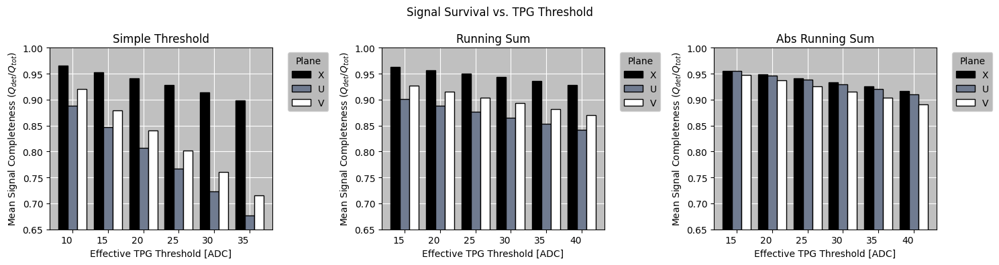

In [2]:

def PlotSigCompleteness(df, THRESHOLDS, ax, title):
    mean_values = {
        threshold: {
            'X': (df.groupby(f'event_{threshold}')[f'detQ_X_{threshold}'].mean() / df.groupby(f'event_{threshold}')[f'totQ_X_{threshold}'].mean()).mean(),
            'U': (df.groupby(f'event_{threshold}')[f'detQ_U_{threshold}'].mean() / df.groupby(f'event_{threshold}')[f'totQ_U_{threshold}'].mean()).mean(),
            'V': (df.groupby(f'event_{threshold}')[f'detQ_V_{threshold}'].mean() / df.groupby(f'event_{threshold}')[f'totQ_V_{threshold}'].mean()).mean()
        }
        for threshold in THRESHOLDS
    }

    mean_df = pd.DataFrame(mean_values).T
    mean_df.index.name = 'Threshold'

    colors = plt.get_cmap('bone')(np.linspace(0, 1, 3))

    mean_df.plot(kind='bar', figsize=(15, 4),  width=0.8, zorder=6, edgecolor='k', color=colors, ax=ax)
    ax.set_xlabel('Effective TPG Threshold [ADC]')
    ax.set_ylabel(r'Mean Signal Completeness ($Q_{det}$/$Q_{tot}$)')
    ax.set_title(f'{title}')
    ax.legend(title="Plane", bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='right')
    ax.grid(which='both', linestyle='-', color='white')
    ax.set_ylim(0.65, 1)
    ax.set_facecolor('silver')

def plot_all_datasets(df_st, df_rs, df_ars, THRESHOLDS):
    fig, axes = plt.subplots(1, 3, figsize=(28, 6))  # 1 row, 3 columns for subplots
    plt.suptitle("Signal Survival vs. TPG Threshold")
    PlotSigCompleteness(df_st, THRESHOLDS[:-1], axes[0], title='Simple Threshold')
    PlotSigCompleteness(df_rs, THRESHOLDS[1:], axes[1], title='Running Sum')
    PlotSigCompleteness(df_ars, THRESHOLDS[1:], axes[2], title='Abs Running Sum')

    plt.tight_layout()
    plt.show()

plot_all_datasets(df_st, df_rs, df_ars, THRESHOLDS)


## 2. Purity (noise levels at each threshold )

                      X             U             V
Threshold                                          
10         4.202445e+06  8.407085e+06  8.406394e+06
15         3.796720e+04  2.522683e+05  2.520259e+05
20         1.775185e+02  2.045796e+03  2.050833e+03
25         8.000000e+01  1.147222e+01  1.352778e+01
30         5.991667e+01  2.861111e+00  4.916667e+00
35         4.784259e+01  1.546296e+00  2.861111e+00
                      X             U             V
Threshold                                          
15         3.182195e+06  7.034351e+06  7.033940e+06
20         3.747209e+05  1.571110e+06  1.570838e+06
25         2.760852e+04  2.502498e+05  2.501444e+05
30         1.523648e+03  2.848231e+04  2.844627e+04
35         2.786667e+02  2.370269e+03  2.346917e+03
40         2.143889e+02  1.523704e+02  1.492407e+02
                       X             U             V
Threshold                                           
15         929771.759259  2.752866e+06  2.752079e+06
20       

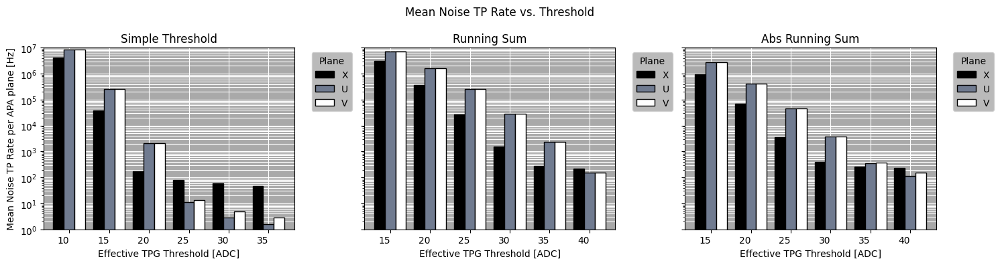

In [4]:

def RatePerAPA(TP_counts):
    window_time = 6000 * 500e-9 #nticks * time per tick (500ns)
    n_APAs = 12
    return (TP_counts / window_time) * (1 / n_APAs) if TP_counts != 0 else 0

def PlotNoiseRates(df, THRESHOLDS, ax, title):
    mean_values = {
        threshold: {
            'X': RatePerAPA(df.groupby(f'event_{threshold}')[f'n_noise_TPs_X_{threshold}'].mean().mean()),
            'U': RatePerAPA(df.groupby(f'event_{threshold}')[f'n_noise_TPs_U_{threshold}'].mean().mean()),
            'V': RatePerAPA(df.groupby(f'event_{threshold}')[f'n_noise_TPs_V_{threshold}'].mean().mean()),
        }
        for threshold in THRESHOLDS
    }
    mean_df = pd.DataFrame(mean_values).T
    mean_df.index.name = 'Threshold'
    colors = plt.get_cmap('bone')(np.linspace(0, 1, 3))
    print(mean_df)

    mean_df.plot(kind='bar', figsize=(15, 4), width=0.8, zorder=6, edgecolor='k', color=colors, ax=ax)
    ax.set_xlabel('Effective TPG Threshold [ADC]')
    ax.set_ylabel('Mean Noise TP Rate per APA plane [Hz]')
    ax.set_title(f'{title}')
    ax.legend(title="Plane", bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='right')
    ax.grid(which='both', linestyle='-', color='white')
    ax.set_yscale('log')
    ax.set_ylim(1, 1e7)
    ax.set_facecolor('darkgrey')

def plot_all_datasets_noise(df_st, df_rs, df_ars, THRESHOLDS):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    plt.suptitle("Mean Noise TP Rate vs. Threshold")
    PlotNoiseRates(df_st, THRESHOLDS[:-1], axes[0], title='Simple Threshold')
    PlotNoiseRates(df_rs, THRESHOLDS[1:], axes[1], title='Running Sum')
    PlotNoiseRates(df_ars, THRESHOLDS[1:], axes[2], title='Abs Running Sum')
    plt.tight_layout()
    plt.show()

plot_all_datasets_noise(df_st, df_rs, df_ars, THRESHOLDS)


 ## 2.1 Comparing noise levels of the running sums 

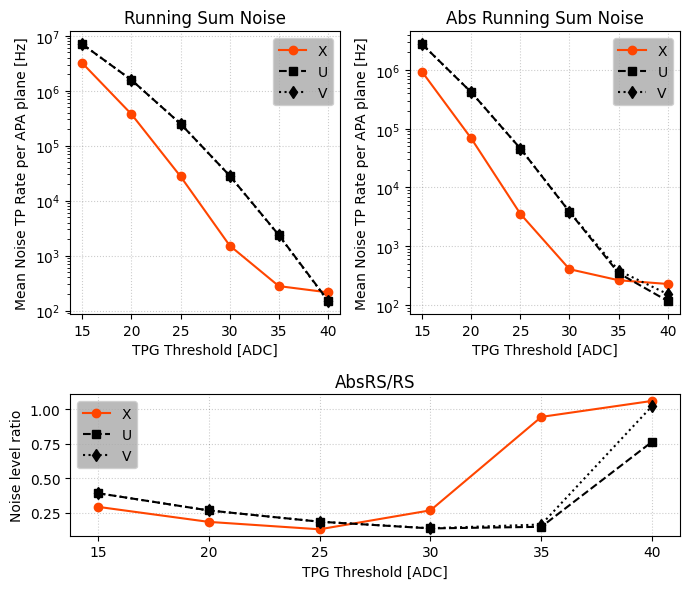

In [6]:

def MeanNoise(df, THRESHOLDS ):
    mean_values = {
        threshold: {
            'X': RatePerAPA(df.groupby(f'event_{threshold}')[f'n_noise_TPs_X_{threshold}'].mean().mean()),
            'U': RatePerAPA(df.groupby(f'event_{threshold}')[f'n_noise_TPs_U_{threshold}'].mean().mean()),
            'V': RatePerAPA(df.groupby(f'event_{threshold}')[f'n_noise_TPs_V_{threshold}'].mean().mean()),
        }
        for threshold in THRESHOLDS
    }
    mean_df = pd.DataFrame(mean_values).T
    mean_df.index.name = 'Threshold'

    return mean_df


rs_noise = MeanNoise(df_rs, THRESHOLDS[1:])
ars_noise = MeanNoise(df_ars, THRESHOLDS[1:])
t= THRESHOLDS[1:]


fig = plt.figure(figsize=(7, 6), dpi = 100)
gs = gridspec.GridSpec(2, 2, height_ratios=[2, 1])

ax0, ax1 = fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[1, :])

for ax, data, title in zip([ax0, ax1], [rs_noise, ars_noise], ["Running Sum Noise", "Abs Running Sum Noise"]):
    ax.plot(t, data.X, 'o-', color='orangered', label='X')
    ax.plot(t, data.U, 'sk--', label='U')
    ax.plot(t, data.V, 'kd', linestyle='dotted', label='V')
    ax.set_title(title)
    ax.set_yscale('log')
ax0.set_ylabel('Mean Noise TP Rate per APA plane [Hz]')
ax1.set_ylabel('Mean Noise TP Rate per APA plane [Hz]')

ax2.plot(t, ars_noise.X / rs_noise.X, 'o-', color='orangered', label='X')
ax2.plot(t, ars_noise.U / rs_noise.U, 'sk--', label='U')
ax2.plot(t, ars_noise.V / rs_noise.V, 'kd', linestyle='dotted', label='V')
ax2.set_title("AbsRS/RS")
ax2.set_ylabel("Noise level ratio")

for ax in [ax0, ax1, ax2]:
    ax.legend()
    ax.grid()
    ax.set_xlabel("TPG Threshold [ADC]")
    ax.set_facecolor('white')
    ax.grid( alpha =0.2, color='k')

plt.tight_layout()
plt.show()


#### The above plot basically tells us that for a given threshold RS is noisier than AbsRS, until at higher thresholds the ratio --> 1 as the two become comparable. 

# Once thresholds are chosen, fix them & lets insepct the TPs


In [ ]:
max_ev = 10e3

def load_and_concat(filepath_col, filepath_ind, maxev):
    col_thresh_data =  load_data(filepath_col, TP_BRANCHES, maxev)
    ind_thresh_data =  load_data(filepath_ind, TP_BRANCHES, maxev)

    coltps = col_thresh_data[col_thresh_data.TP_plane==2]
    indtps = ind_thresh_data[ind_thresh_data.TP_plane!=2]

    return pd.concat([coltps, indtps], ignore_index=True).sort_values(by='event').reset_index(drop=True)
 

tps = load_and_concat('data/ST_tps_t20_n10k.root', 'data/ST_tps_t25_n10k.root', max_ev)
ars = load_and_concat('data/AbsRS_tps_t30_n10k.root', 'data/AbsRS_tps_t35_n10k.root', max_ev)
rs = load_and_concat('data/RS_tps_t35_n10k.root', 'data/RS_tps_t40_n10k.root', max_ev)


mc = load_data('data/ST_tps_t20_n10k.root', MC_BRANCHES, max_ev)
mc = mc.sort_values(by='event').reset_index(drop=True)

events = tps.event.unique()

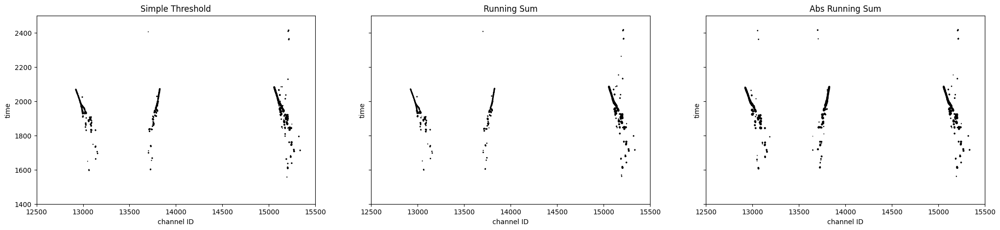

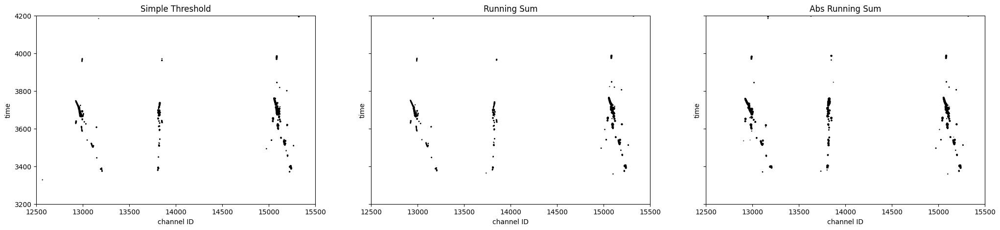

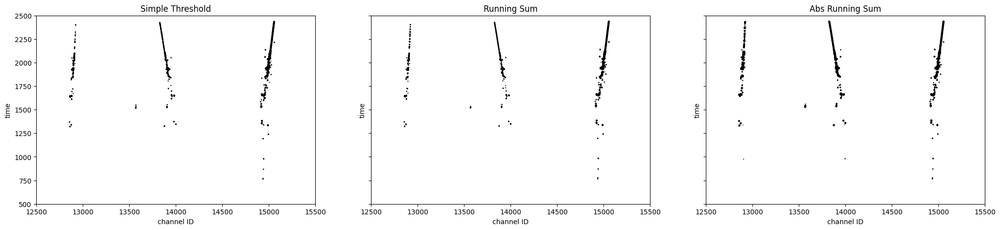

In [8]:
event =events[28]; cmap = 'cool'
title=['Simple Threshold','Running Sum', "Abs Running Sum"]
fig, ax = plt.subplots(1,3, figsize=(25,5), sharex = True, sharey= True)
x = tps[tps.event ==event]
ax[0].scatter(x.TP_channel, x.TP_peakT,s=x.TP_TOT/5,c='k')
ax[0].set_xlim(12500,15500)
ax[0].set_ylim(1400,2500)

x = rs[rs.event ==event]
ax[1].scatter(x.TP_channel, x.TP_peakT, s=x.TP_TOT/10,c='k')

x = ars[ars.event ==event]
ax[2].scatter(x.TP_channel, x.TP_peakT, s=x.TP_TOT/10,c='k')
for i in range(0,3):
    ax[i].grid(alpha=0)
    ax[i].set_facecolor('white')
    ax[i].set_title(title[i])
    ax[i].set_xlabel("channel ID")
    ax[i].set_ylabel("time")
plt.show()

event =events[48]; cmap = 'cool'
title=['Simple Threshold','Running Sum', "Abs Running Sum"]
fig, ax = plt.subplots(1,3, figsize=(25,5), sharex = True, sharey= True)
x = tps[tps.event ==event]
ax[0].scatter(x.TP_channel, x.TP_peakT,s=x.TP_TOT/5,c='k')
ax[0].set_xlim(12500,15500)
ax[0].set_ylim(3200,4200)

x = rs[rs.event ==event]
ax[1].scatter(x.TP_channel, x.TP_peakT, s=x.TP_TOT/10,c='k')

x = ars[ars.event ==event]
ax[2].scatter(x.TP_channel, x.TP_peakT, s=x.TP_TOT/10,c='k')
for i in range(0,3):
    ax[i].grid(alpha=0)
    ax[i].set_facecolor('white')
    ax[i].set_title(title[i])
    ax[i].set_xlabel("channel ID")
    ax[i].set_ylabel("time")
plt.show()


event =events[5]; cmap = 'cool'
title=['Simple Threshold','Running Sum', "Abs Running Sum"]
fig, ax = plt.subplots(1,3, figsize=(25,5), sharex = True, sharey= True)
x = tps[tps.event ==event]
ax[0].scatter(x.TP_channel, x.TP_peakT,s=x.TP_TOT/5,c='k')
ax[0].set_xlim(12500,15500)
ax[0].set_ylim(500,2500)

x = rs[rs.event ==event]
ax[1].scatter(x.TP_channel, x.TP_peakT, s=x.TP_TOT/10,c='k')

x = ars[ars.event ==event]
ax[2].scatter(x.TP_channel, x.TP_peakT, s=x.TP_TOT/10,c='k')
for i in range(0,3):
    ax[i].grid(alpha=0)
    ax[i].set_facecolor('white')
    ax[i].set_title(title[i])
    ax[i].set_xlabel("channel ID")
    ax[i].set_ylabel("time")
plt.show()


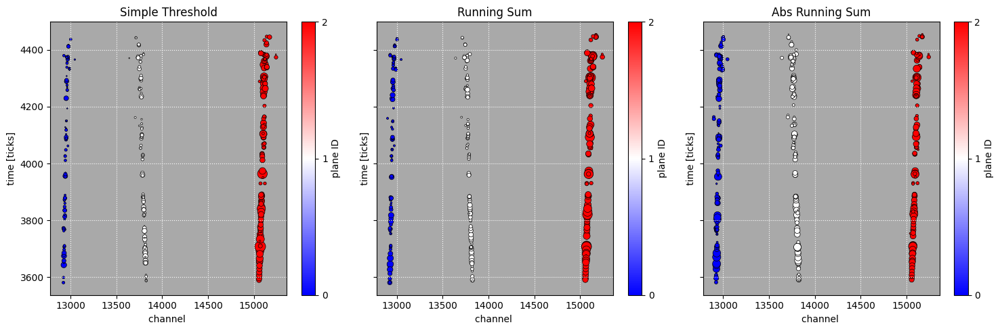

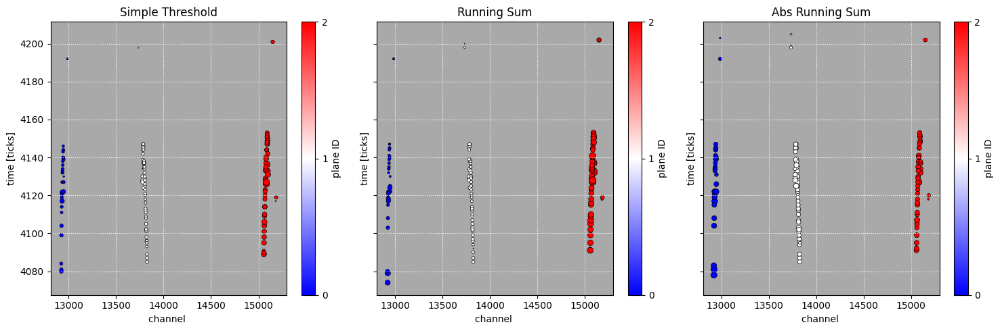

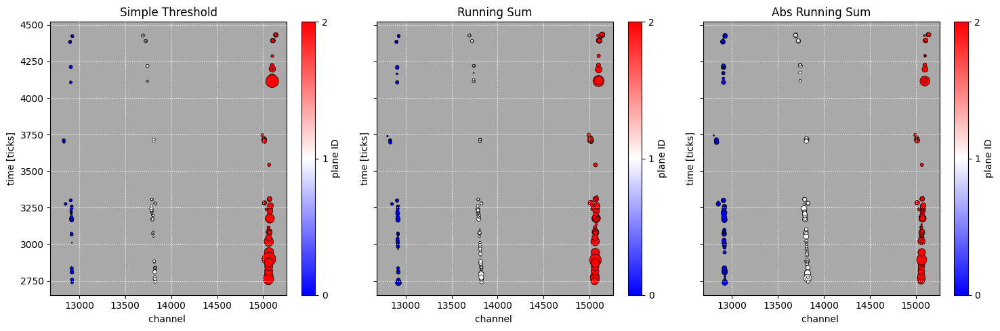

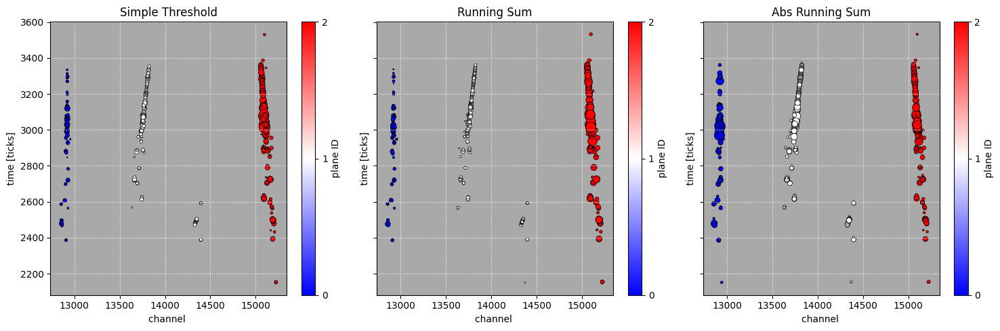

In [10]:
#Event displays 
for e in [1007, 1054, 204, 150]:

    x = tps[(tps.event == events[e]) & (tps.TP_signal==1) ]
    xx = rs[(rs.event == events[e]) &(rs.TP_signal==1) ]
    xxx = ars[(ars.event == events[e]) &(ars.TP_signal==1) ]
    label =['Simple Threshold', "Running Sum", "Abs Running Sum"]
    cmap ='bwr'
    fig,ax = plt.subplots(1,3, figsize=(15,5), sharex=True, sharey=True)
    s = ax[0].scatter(x.TP_channel, x.TP_startT,   s=x.TP_TOT*1.5, c=x.TP_plane, cmap=cmap , edgecolor='k', linewidth=0.5, label="nTPs = %.0f" % len(x.TP_channel))
    ax[1].scatter(xx.TP_channel, xx.TP_startT, s=xx.TP_TOT, c=xx.TP_plane, cmap=cmap, edgecolor='k', linewidth=0.5,label="nTPs = %.0f" % len(xx.TP_channel))
    ax[2].scatter(xxx.TP_channel, xxx.TP_startT,   s=xxx.TP_TOT/1.5 ,c=xxx.TP_plane, edgecolor='k', linewidth=0.5,cmap=cmap, label="nTPs = %.0f" % len(xxx.TP_channel))
    for i in [0,1,2]:
        ax[i].set_xlabel("channel ")
        ax[i].set_ylabel("time [ticks]")
        ax[i].set_title(label[i])
        cbar = plt.colorbar(s, ax=ax[i])
        cbar.set_ticks([0,1,2])
        cbar.set_label("plane ID")
        ax[i].set_facecolor('darkgrey')
    plt.tight_layout()
    plt.show()




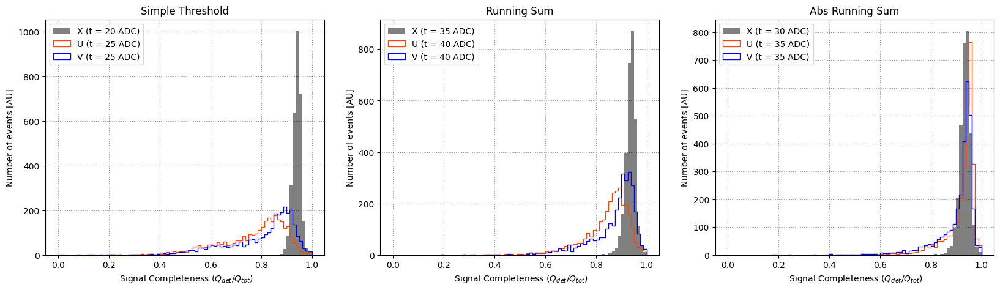

In [11]:
fig,ax = plt.subplots(1,3 ,figsize= (20,5))

b= np.linspace(0,1.,81)
label =['Simple Threshold', "Running Sum", "Abs Running Sum"]

ax[0].hist(df_st.detQ_X_20/df_st.totQ_X_20, color = 'grey', bins = b, label ='X (t = 20 ADC)')
ax[0].hist(df_st.detQ_U_25/df_st.totQ_U_25, color = 'orangered', histtype='step',bins = b, label ='U (t = 25 ADC)')
ax[0].hist(df_st.detQ_V_25/df_st.totQ_V_25, color = 'b', histtype='step', bins = b, label ='V (t = 25 ADC)')

ax[1].hist(df_rs.detQ_X_35/df_rs.totQ_X_35, color = 'grey', bins = b, label ='X (t = 35 ADC)')
ax[1].hist(df_rs.detQ_U_40/df_rs.totQ_U_40, color = 'orangered', histtype='step',bins = b, label ='U (t = 40 ADC)')
ax[1].hist(df_rs.detQ_V_40/df_rs.totQ_V_40, color = 'b', histtype='step', bins = b, label ='V (t = 40 ADC)')

ax[2].hist(df_ars.detQ_X_30/df_ars.totQ_X_30, color = 'grey', bins = b, label ='X (t = 30 ADC)')
ax[2].hist(df_ars.detQ_U_35/df_ars.totQ_U_35, color = 'orangered', histtype='step',bins = b, label ='U (t = 35 ADC)')
ax[2].hist(df_ars.detQ_V_35/df_ars.totQ_V_35, color = 'b', histtype='step', bins = b, label ='V (t = 35 ADC)')

for i in [0,1,2]:
    ax[i].legend(facecolor='white')
    ax[i].set_title(label[i])
    ax[i].set_ylabel("Number of events [AU]")
    ax[i].set_xlabel(r" Signal Completeness ($Q_{det}/Q_{tot})$")
    ax[i].grid(alpha = 0.4)
    ax[i].set_facecolor('white')
    ax[i].grid(color='k')
plt.show()

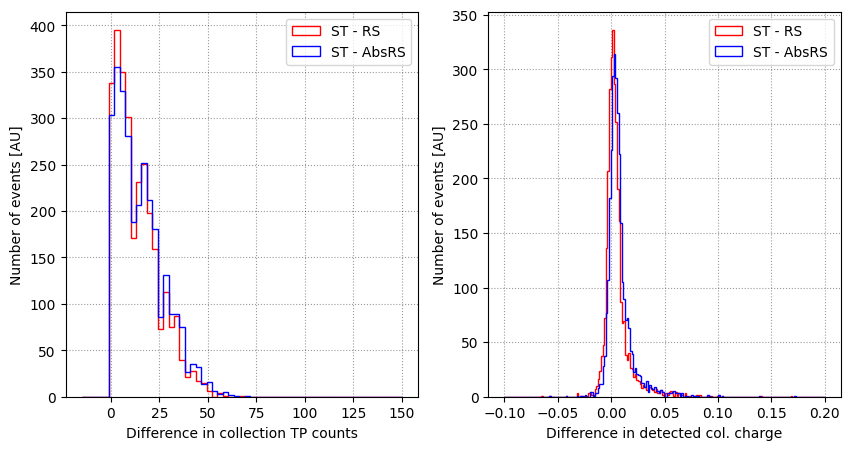

In [342]:
fig ,ax =plt.subplots(1,2, figsize= (10,5))
b= np.linspace(-15,150.,60)

ax[0].hist(df_st.n_signal_TPs_X_20-df_rs.n_signal_TPs_X_35, bins =b, color='r', histtype='step', label = 'ST - RS')
ax[0].hist(df_st.n_signal_TPs_X_20-df_ars.n_signal_TPs_X_30 , bins =b, histtype='step', color='b', label = 'ST - AbsRS')
ax[0].set_xlabel("Difference in collection TP counts")

b =np.linspace(-0.1,0.2,200)
ax[1].hist(df_st.detQ_X_20/df_st.totQ_X_20-df_rs.detQ_X_35/df_rs.totQ_X_35, bins =b, color='r', histtype='step', label = 'ST - RS')
ax[1].hist(df_st.detQ_X_20/df_st.totQ_X_20-df_ars.detQ_X_30/df_ars.totQ_X_30, bins =b, color='b', histtype='step', label = 'ST - AbsRS')
ax[1].set_xlabel("Difference in detected col. charge")

for i in [0,1]:
    ax[i].grid(color='k', alpha =0.4)
    ax[i].set_facecolor('white')
    ax[i].legend(facecolor='white')
    ax[i].set_ylabel("Number of events [AU]")
plt.show()




# TP properties vs. event orientation 

In [ ]:
facecolor = 'silver'

# Function to compute the event angle w.r.t wire plane orientation for col. and ind. 
def calculate_angles(px, py, pz, p_mag):
    """
    Compute θ_y (angle w.r.t vertical y-axis, with θ_y = 0),
    θ_U (angle w.r.t U-plane wires at +37.5°),
    θ_V (angle w.r.t V-plane wires at -37.5°),
    θ_xz (angle in drift-beam xz-plane),
    and θ_xz for rotated U and V planes.
    
    Args:
    px, py, pz, p_mag -- components of momentum in x, y, z directions & magnitude of momentum vector, p.
    
    Returns:
    theta_y, theta_U, theta_V, theta_xz, theta_xz_U, theta_xz_V (all in degrees!!!!!)
    """
    # θ_y: Angle relative to vertical y-axis, where θ_y = 0 is upward
    #theta_y = np.degrees( np.arcsin(py / p_mag))
    theta_y = np.degrees(np.arccos(py / p_mag))
    #theta_y = (theta_y + 180) % 360 - 180
    
    # θ_xz: Angle in the xz-plane (measured from z-axis)
    theta_xz = np.degrees(np.arctan2(px, pz))
    
    # Rotation angles for U and V planes (±37.5 degrees in zy-plane)
    theta_rot_U = np.radians(-37.5)  # U-plane rotation
    theta_rot_V = np.radians(37.5)   # V-plane rotation
    
    # Rotate momentum components in zy-plane for U-plane
    p_y_U = py * np.cos(theta_rot_U) - pz * np.sin(theta_rot_U)
    p_z_U = py * np.sin(theta_rot_U) + pz * np.cos(theta_rot_U)
    theta_xz_U = np.degrees(np.arctan2(px, p_z_U))
    theta_y_U =  90 - np.degrees(np.arcsin(p_y_U / p_mag))
    #theta_y_U = (theta_y_U + 180) % 360 - 180 
 
    # Rotate momentum components in zy-plane for V-plane
    p_y_V = py * np.cos(theta_rot_V) - pz * np.sin(theta_rot_V)
    p_z_V = py * np.sin(theta_rot_V) + pz * np.cos(theta_rot_V)
    theta_xz_V = np.degrees(np.arctan2(px, p_z_V))
    theta_y_V = 90-np.degrees(np.arcsin(p_y_V / p_mag))
    #theta_y_V = (theta_y_V + 180) % 360 - 180

    return theta_y, theta_y_U, theta_y_V, abs(theta_xz), abs(theta_xz_U), abs(theta_xz_V)

theta_y, theta_y_U, theta_y_V, theta_xz, theta_xz_U, theta_xz_V = calculate_angles(mc.Px, mc.Py, mc.Pz, mc.P)

mc['theta_y'] = theta_y
mc['theta_yU'] = theta_y_U
mc['theta_yV'] = theta_y_V
mc['theta_xz'] = theta_xz
mc['theta_xzU'] = theta_xz_U
mc['theta_xzV'] = theta_xz_V



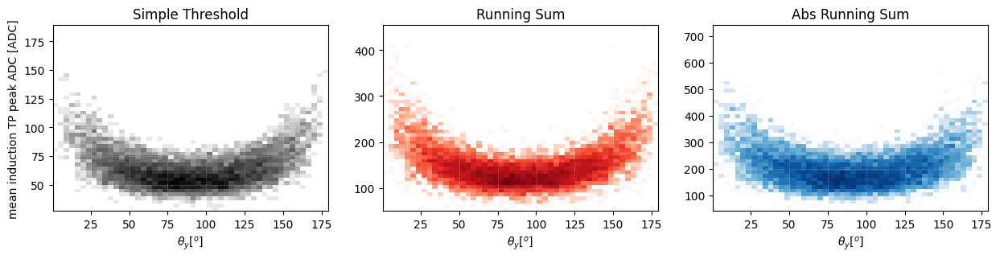

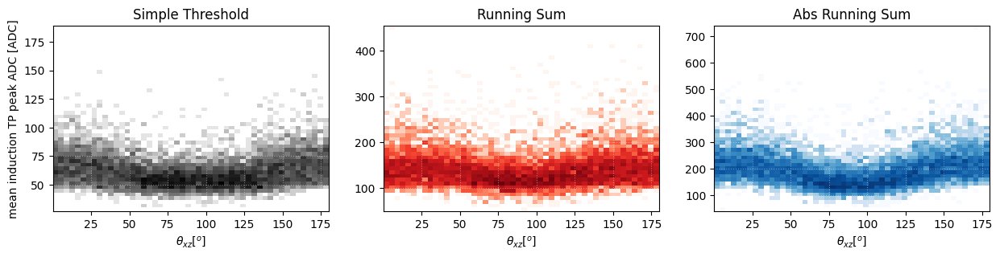

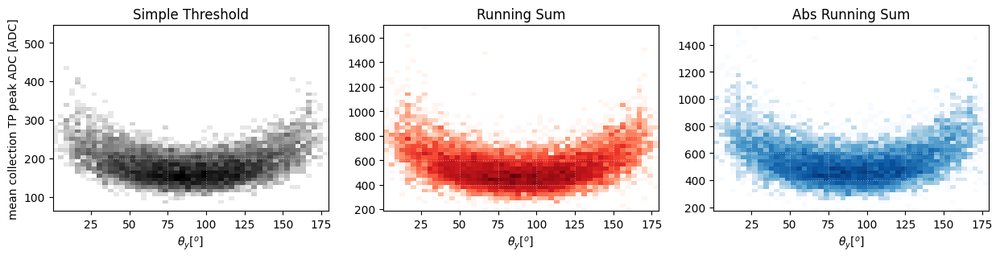

In [12]:

fig,ax = plt.subplots(1,3, figsize=(15,3), sharex=True, sharey=False)
b = (50,50)
ax[0].hist2d(mc[mc.event.isin(tps[(tps.TP_plane==0) &(tps.TP_signal==1)].event.unique())].theta_yU, 
              tps[(tps.TP_plane==0) &(tps.TP_signal==1)].groupby('event').TP_peakADC.mean(),
                cmap='Greys',bins=b, norm = LogNorm())


ax[1].hist2d(mc[mc.event.isin(rs[(rs.TP_plane==0) &(rs.TP_signal==1)].event.unique())].theta_yU, 
              rs[(rs.TP_plane==0) &(rs.TP_signal==1)].groupby('event').TP_peakADC.mean(),
              cmap='Reds', bins=b, norm = LogNorm())

ax[2].hist2d(mc[mc.event.isin(ars[(ars.TP_signal==1) & (ars.TP_plane==0)].event.unique())].theta_yU, ars[(ars.TP_plane==0) &(ars.TP_signal==1)].groupby('event').TP_peakADC.mean(),
              cmap='Blues',bins=b, norm = LogNorm())
ax[0].set_ylabel('mean induction TP peak ADC [ADC]')

labels  = ['Simple Threshold', "Running Sum", "Abs Running Sum"]
for i in [0,1,2]:
    ax[i].grid(alpha=0.4)
    ax[i].set_xlabel(r"$\theta_y [^{o}]$")
    ax[i].set_title(labels[i])
    ax[i].set_facecolor('white')
plt.show()

fig,ax = plt.subplots(1,3, figsize=(15,3), sharex=True, sharey=False)
ax[0].hist2d(mc[mc.event.isin(tps[(tps.TP_plane==0) &(tps.TP_signal==1)].event.unique())].theta_xzU, 
            tps[(tps.TP_plane==0) &(tps.TP_signal==1)].groupby('event').TP_peakADC.mean(), 
            cmap='Greys',bins=b, norm = LogNorm())

ax[1].hist2d(mc[mc.event.isin(rs[(rs.TP_plane==0) &(rs.TP_signal==1)].event.unique())].theta_xzU, 
            rs[(rs.TP_plane==0) &(rs.TP_signal==1)].groupby('event').TP_peakADC.mean(),
            cmap='Reds', bins=b, norm = LogNorm())
ax[2].hist2d(mc[mc.event.isin(ars[(ars.TP_signal==1) & (ars.TP_plane==0)].event.unique())].theta_xzU, ars[(ars.TP_plane==0) &(ars.TP_signal==1)].groupby('event').TP_peakADC.mean(), 
             cmap='Blues',bins=b, norm = LogNorm())

ax[0].set_ylabel('mean induction TP peak ADC [ADC]')

for i in [0,1,2]:
    ax[i].grid(alpha=0.4)
    ax[i].set_xlabel(r"$\theta_{xz} [^{o}]$")
    ax[i].set_title(labels[i])
    ax[i].set_facecolor('white')

plt.show()


fig,ax = plt.subplots(1,3, figsize=(15,3), sharex=True, sharey=False)
ax[0].hist2d(mc[mc.event.isin(tps[(tps.TP_plane==2) &(tps.TP_signal==1)].event.unique())].theta_y, 
            tps[(tps.TP_plane==2) &(tps.TP_signal==1)].groupby('event').TP_peakADC.mean(),
            cmap='Greys',bins=b, norm = LogNorm())


ax[1].hist2d(mc[mc.event.isin(rs[(rs.TP_plane==2) &(rs.TP_signal==1)].event.unique())].theta_y, 
              rs[(rs.TP_plane==2) &(rs.TP_signal==1)].groupby('event').TP_peakADC.mean(),
              cmap='Reds', bins=b, norm = LogNorm())
ax[2].hist2d(mc[mc.event.isin(ars[(ars.TP_signal==1) & (ars.TP_plane==2)].event.unique())].theta_y, ars[(ars.TP_plane==2) &(ars.TP_signal==1)].groupby('event').TP_peakADC.mean(), 
            cmap='Blues',bins=b, norm = LogNorm())

for i in [0,1,2]:
    ax[i].grid(alpha=0.4)
    ax[i].set_xlabel(r"$\theta_y [^{o}]$")
    ax[i].set_title(labels[i])
    ax[i].set_facecolor('white')
ax[0].set_ylabel('mean collection TP peak ADC [ADC]')

plt.show()

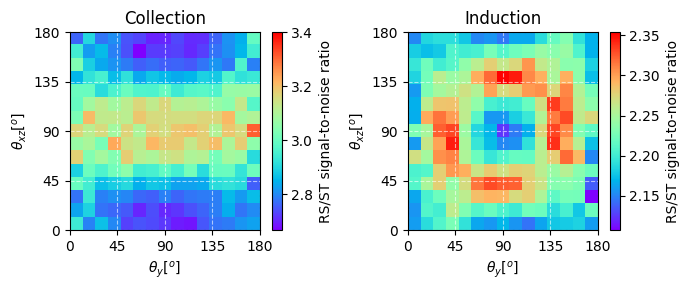

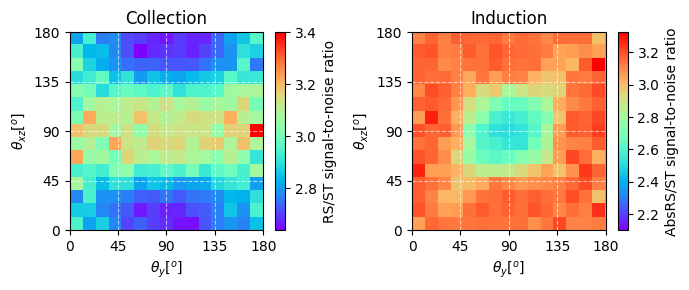

In [13]:
mcf = mc[mc.event.isin(tps[(tps.TP_plane==0) &(tps.TP_signal==1)].event.unique())]

def PlotSNDiff(weights, xedges, yedges, title, colorbar_label, vmin=None, vmax=None):
    hist, _, _ = np.histogram2d(mcf.theta_y, mcf.theta_xz, bins=(xedges, yedges), weights=weights)
    counts, _, _ = np.histogram2d(mcf.theta_y, mcf.theta_xz, bins=(xedges, yedges))
    mean_hist = hist / counts
    mean_hist[counts == 0] = np.nan
    im = plt.imshow(mean_hist.T, origin='lower', aspect='auto', cmap='rainbow', interpolation='nearest',
                    vmin=vmin, vmax=vmax, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    plt.colorbar(im, label=colorbar_label)
    plt.xlabel(r'$\theta_y [^{o}]$')
    plt.ylabel(r'$\theta_{xz} [^{o}]$')
    plt.xticks([0,45,90, 90+45, 180])
    plt.yticks([0,45,90, 90+45, 180])
    plt.grid(alpha=0.6, color='white', linestyle='dashed')        
    plt.title(title)


xedges = np.linspace(min(mcf.theta_y), max(mcf.theta_y), 16)
yedges = np.linspace(min(mcf.theta_xz), max(mcf.theta_xz), 16)

fig, axs = plt.subplots(1, 2, figsize=(7, 3))

SN_ind_rs = (rs[(rs.TP_plane!=2) &(rs.TP_signal==1)].groupby('event').TP_peakADC.mean())/((tps[(tps.TP_plane!=2) &(tps.TP_signal==1)].groupby('event').TP_peakADC.mean()))
SN_col_rs = (rs[(rs.TP_plane==2) &(rs.TP_signal==1)].groupby('event').TP_peakADC.mean())/((tps[(tps.TP_plane==2) &(tps.TP_signal==1)].groupby('event').TP_peakADC.mean()))

# Convert SN_ind_rs to a DataFrame and reset the index to 'event'
SN_ind_rs_df = SN_ind_rs.reset_index(name='SN_ind_rs')
SN_col_rs_df = SN_col_rs.reset_index(name='SN_col_rs')

mcf_with_SN = mcf.merge(SN_col_rs_df, on='event', how='left')
weights = mcf_with_SN['SN_col_rs'].values
plt.sca(axs[0])
PlotSNDiff(weights, xedges, yedges, 'Collection', 'RS/ST signal-to-noise ratio',vmax=3.4)


mcf_with_SN = mcf.merge(SN_ind_rs_df, on='event', how='left')
weights = mcf_with_SN['SN_ind_rs'].values
plt.sca(axs[1])
PlotSNDiff(weights, xedges, yedges, 'Induction', 'RS/ST signal-to-noise ratio')

plt.tight_layout()
plt.show()





#AbsRS
fig, axs = plt.subplots(1, 2, figsize=(7, 3))

SN_ind_ars = (ars[(ars.TP_plane!=2) &(ars.TP_signal==1)].groupby('event').TP_peakADC.mean())/((tps[(tps.TP_plane!=2) &(tps.TP_signal==1)].groupby('event').TP_peakADC.mean()))
SN_col_ars = (ars[(ars.TP_plane==2) &(ars.TP_signal==1)].groupby('event').TP_peakADC.mean()/((tps[(tps.TP_plane==2) &(tps.TP_signal==1)].groupby('event').TP_peakADC.mean())))

# Convert SN_ind_rs to a DataFrame and reset the index to 'event'
SN_ind_ars_df = SN_ind_ars.reset_index(name='SN_ind_ars')
SN_col_ars_df = SN_col_ars.reset_index(name='SN_col_ars')

mcf_with_SN = mcf.merge(SN_col_ars_df, on='event', how='left')
weights = mcf_with_SN['SN_col_ars'].values
plt.sca(axs[0])
PlotSNDiff(weights, xedges, yedges, 'Collection', 'RS/ST signal-to-noise ratio',vmax=3.4)


mcf_with_SN = mcf.merge(SN_ind_ars_df, on='event', how='left')
weights = mcf_with_SN['SN_ind_ars'].values
plt.sca(axs[1])
PlotSNDiff(weights, xedges, yedges, 'Induction', 'AbsRS/ST signal-to-noise ratio', vmin=2.1)

plt.tight_layout()
plt.show()


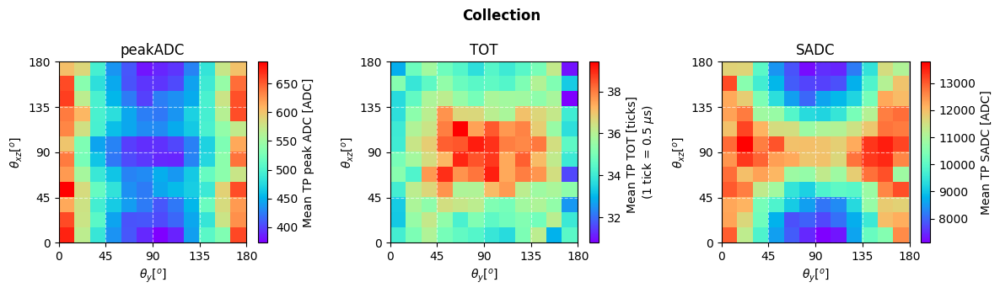

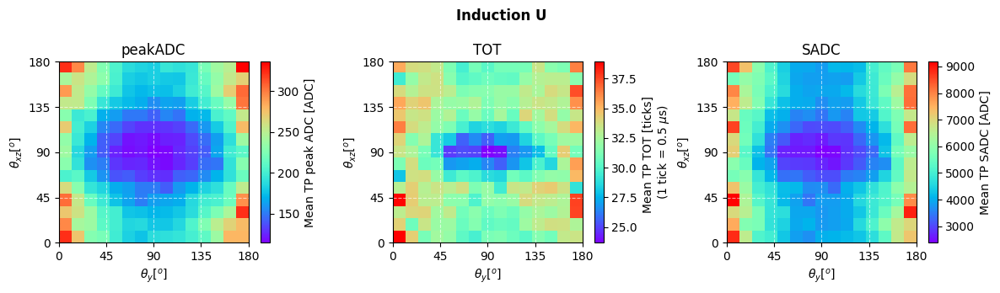

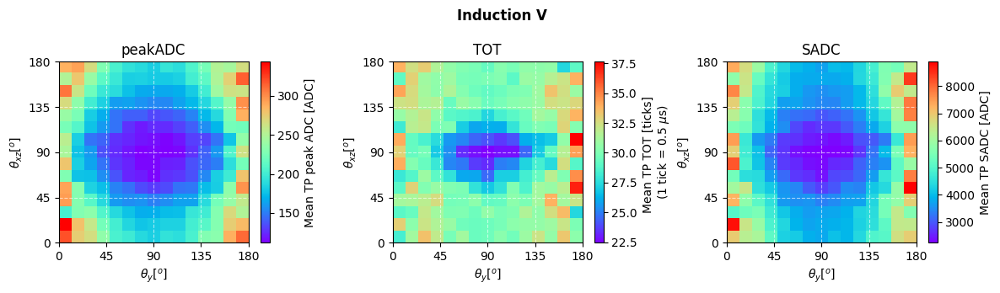

In [14]:
#Collection 
def PlotAngleDistributions(weights, xedges, yedges, title, colorbar_label, vmin=None, vmax=None):
    hist, _, _ = np.histogram2d(mc.theta_y, mc.theta_xz, bins=(xedges, yedges), weights=weights)
    counts, _, _ = np.histogram2d(mc.theta_y, mc.theta_xz, bins=(xedges, yedges))
    
    mean_hist = hist / counts
    mean_hist[counts == 0] = np.nan
    
    im = plt.imshow(mean_hist.T, origin='lower', aspect='auto', cmap='rainbow', interpolation='nearest',
                    vmin=vmin, vmax =vmax, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    plt.colorbar(im, label=colorbar_label)
    plt.xlabel(r'$\theta_y [^{o}]$')
    plt.ylabel(r'$\theta_{xz} [^{o}]$')
    plt.xticks([0,45,90, 90+45, 180])
    plt.yticks([0,45,90, 90+45, 180])
    plt.grid(alpha=0.6, color='white', linestyle='dashed')        
    plt.title(title)
    plt.suptitle("Collection", fontweight="bold")


tps2 = ars[ars.TP_plane==2]
xedges = np.linspace(min(mc.theta_y), max(mc.theta_y), 13)
yedges = np.linspace(min(mc.theta_xz), max(mc.theta_xz), 13)


fig, axs = plt.subplots(1, 3, figsize=(12, 3.5))

weights = tps2.groupby('event').TP_peakADC.mean().values
plt.sca(axs[0])
PlotAngleDistributions(weights, xedges, yedges, 'peakADC', 'Mean TP peak ADC [ADC]')

weights_tot = tps2.groupby('event').TP_TOT.mean().values
plt.sca(axs[1])
PlotAngleDistributions(weights_tot, xedges, yedges, 'TOT', 'Mean TP TOT [ticks] \n(1 tick = 0.5 $\mu$s)' )

weights_sadc = tps2.groupby('event').TP_SADC.mean().values
plt.sca(axs[2])
PlotAngleDistributions(weights_sadc, xedges, yedges, 'SADC', 'Mean TP SADC [ADC]')

plt.tight_layout()
plt.show()


#U-plane



def PlotAngleDistributions(weights, tps, xedges, yedges, title, colorbar_label, vmin=None, vmax=None):
    plane = 0
    mc_filt = mc[mc.event.isin(tps[tps.TP_plane==0].event.unique())] 
    hist, _, _ = np.histogram2d(mc_filt.theta_yU, mc_filt.theta_xzU, bins=(xedges, yedges), weights=weights)
    counts, _, _ = np.histogram2d(mc_filt.theta_yU, mc_filt.theta_xzU, bins=(xedges, yedges))
    
    mean_hist = hist / counts
    mean_hist[counts == 0] = np.nan
    
    im = plt.imshow(mean_hist.T, origin='lower', aspect='auto', cmap='rainbow', interpolation='nearest',
                    vmin=vmin, vmax=vmax,extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    plt.colorbar(im, label=colorbar_label)
    plt.xlabel(r'$\theta_y [^{o}]$')
    plt.ylabel(r'$\theta_{xz} [^{o}]$')
    plt.xticks([0,45,90, 90+45, 180])
    plt.yticks([0,45,90, 90+45, 180])
    plt.grid(alpha=0.6, color='white', linestyle='dashed')    
    plt.title(title)
    plt.suptitle("Induction U", fontweight="bold")


xedges = np.linspace(min(mc.theta_y), max(mc.theta_y), 16)
yedges = np.linspace(min(mc.theta_xz), max(mc.theta_xz), 16)
tps0 = ars[ars.TP_plane==0]

fig, axs = plt.subplots(1, 3, figsize=(12, 3.5))

weights = tps0.groupby('event').TP_peakADC.mean().values
plt.sca(axs[0])
PlotAngleDistributions(weights, tps0, xedges, yedges, 'peakADC', 'Mean TP peak ADC [ADC]',)

weights_tot = tps0.groupby('event').TP_TOT.mean().values
plt.sca(axs[1])
PlotAngleDistributions(weights_tot, tps0, xedges, yedges, 'TOT', 'Mean TP TOT [ticks] \n(1 tick = 0.5 $\mu$s)')

weights_sadc = tps0.groupby('event').TP_SADC.mean().values
plt.sca(axs[2])
PlotAngleDistributions(weights_sadc, tps0,  xedges, yedges, 'SADC', 'Mean TP SADC [ADC]')

plt.tight_layout()
plt.show()



#V-plane



def PlotAngleDistributions(weights, tps, xedges, yedges, title, colorbar_label, vmin=None, vmax=None):
    plane = 0
    mc_filt = mc[mc.event.isin(tps[tps.TP_plane==1].event.unique())] 
    hist, _, _ = np.histogram2d(mc_filt.theta_yV, mc_filt.theta_xzV, bins=(xedges, yedges), weights=weights)
    counts, _, _ = np.histogram2d(mc_filt.theta_yV, mc_filt.theta_xzV, bins=(xedges, yedges))
    
    mean_hist = hist / counts
    mean_hist[counts == 0] = np.nan
    
    im = plt.imshow(mean_hist.T, origin='lower', aspect='auto', cmap='rainbow', interpolation='nearest',
                    vmin=vmin, vmax=vmax,extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    plt.colorbar(im, label=colorbar_label)
    plt.xlabel(r'$\theta_y [^{o}]$')
    plt.ylabel(r'$\theta_{xz} [^{o}]$')
    plt.xticks([0,45,90, 90+45, 180])
    plt.yticks([0,45,90, 90+45, 180])
    plt.grid(alpha=0.6, color='white', linestyle='dashed')    
    plt.title(title)
    plt.suptitle("Induction V", fontweight="bold")


xedges = np.linspace(min(mc.theta_y), max(mc.theta_y), 16)
yedges = np.linspace(min(mc.theta_xz), max(mc.theta_xz), 16)
tps1 = ars[ars.TP_plane==1]

fig, axs = plt.subplots(1, 3, figsize=(12, 3.5))

weights = tps1.groupby('event').TP_peakADC.mean().values
plt.sca(axs[0])
PlotAngleDistributions(weights, tps1, xedges, yedges, 'peakADC', 'Mean TP peak ADC [ADC]',)

weights_tot = tps1.groupby('event').TP_TOT.mean().values
plt.sca(axs[1])
PlotAngleDistributions(weights_tot, tps1, xedges, yedges, 'TOT', 'Mean TP TOT [ticks] \n(1 tick = 0.5 $\mu$s)')

weights_sadc = tps1.groupby('event').TP_SADC.mean().values
plt.sca(axs[2])
PlotAngleDistributions(weights_sadc, tps1,  xedges, yedges, 'SADC', 'Mean TP SADC [ADC]')

plt.tight_layout()
plt.show()


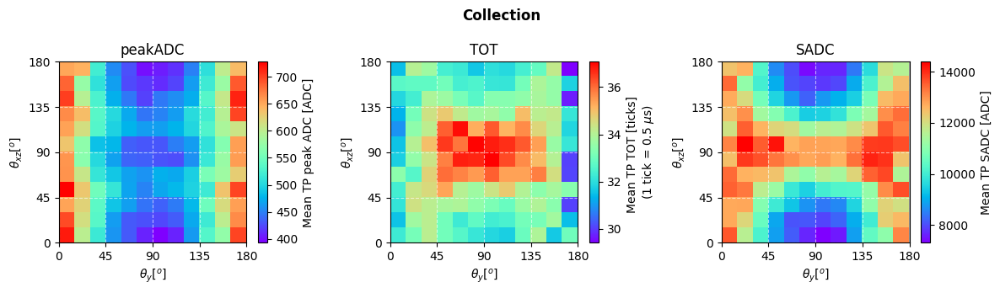

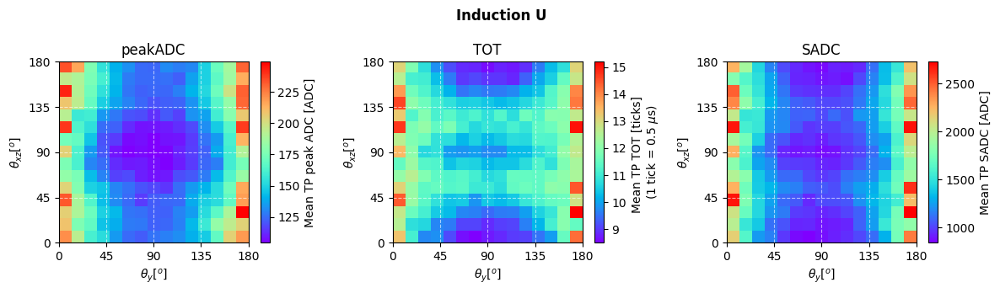

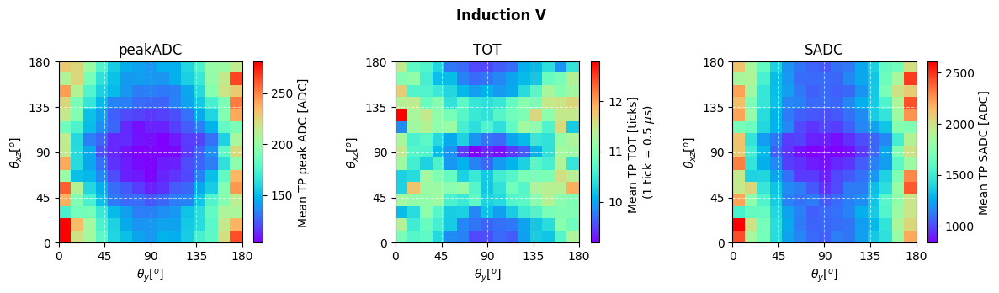

In [300]:
#Collection 
def PlotAngleDistributions(weights, xedges, yedges, title, colorbar_label, vmin=None, vmax=None):
    hist, _, _ = np.histogram2d(mc.theta_y, mc.theta_xz, bins=(xedges, yedges), weights=weights)
    counts, _, _ = np.histogram2d(mc.theta_y, mc.theta_xz, bins=(xedges, yedges))
    
    mean_hist = hist / counts
    mean_hist[counts == 0] = np.nan
    
    im = plt.imshow(mean_hist.T, origin='lower', aspect='auto', cmap='rainbow', interpolation='nearest',
                    vmin=vmin, vmax =vmax, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    plt.colorbar(im, label=colorbar_label)
    plt.xlabel(r'$\theta_y [^{o}]$')
    plt.ylabel(r'$\theta_{xz} [^{o}]$')
    plt.xticks([0,45,90, 90+45, 180])
    plt.yticks([0,45,90, 90+45, 180])
    plt.grid(alpha=0.6, color='white', linestyle='dashed')        
    plt.title(title)
    plt.suptitle("Collection", fontweight="bold")


tps2 = rs[rs.TP_plane==2]
xedges = np.linspace(min(mc.theta_y), max(mc.theta_y), 13)
yedges = np.linspace(min(mc.theta_xz), max(mc.theta_xz), 13)


fig, axs = plt.subplots(1, 3, figsize=(12, 3.5))

weights = tps2.groupby('event').TP_peakADC.mean().values
plt.sca(axs[0])
PlotAngleDistributions(weights, xedges, yedges, 'peakADC', 'Mean TP peak ADC [ADC]')

weights_tot = tps2.groupby('event').TP_TOT.mean().values
plt.sca(axs[1])
PlotAngleDistributions(weights_tot, xedges, yedges, 'TOT', 'Mean TP TOT [ticks] \n(1 tick = 0.5 $\mu$s)' )

weights_sadc = tps2.groupby('event').TP_SADC.mean().values
plt.sca(axs[2])
PlotAngleDistributions(weights_sadc, xedges, yedges, 'SADC', 'Mean TP SADC [ADC]')

plt.tight_layout()
plt.show()


#U-plane



def PlotAngleDistributions(weights, tps, xedges, yedges, title, colorbar_label, vmin=None, vmax=None):
    plane = 0
    mc_filt = mc[mc.event.isin(tps[tps.TP_plane==0].event.unique())] 
    hist, _, _ = np.histogram2d(mc_filt.theta_yU, mc_filt.theta_xzU, bins=(xedges, yedges), weights=weights)
    counts, _, _ = np.histogram2d(mc_filt.theta_yU, mc_filt.theta_xzU, bins=(xedges, yedges))
    
    mean_hist = hist / counts
    mean_hist[counts == 0] = np.nan
    
    im = plt.imshow(mean_hist.T, origin='lower', aspect='auto', cmap='rainbow', interpolation='nearest',
                    vmin=vmin, vmax=vmax,extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    plt.colorbar(im, label=colorbar_label)
    plt.xlabel(r'$\theta_y [^{o}]$')
    plt.ylabel(r'$\theta_{xz} [^{o}]$')
    plt.xticks([0,45,90, 90+45, 180])
    plt.yticks([0,45,90, 90+45, 180])
    plt.grid(alpha=0.6, color='white', linestyle='dashed')    
    plt.title(title)
    plt.suptitle("Induction U", fontweight="bold")


xedges = np.linspace(min(mc.theta_y), max(mc.theta_y), 16)
yedges = np.linspace(min(mc.theta_xz), max(mc.theta_xz), 16)
tps0 = rs[rs.TP_plane==0]

fig, axs = plt.subplots(1, 3, figsize=(12, 3.5))

weights = tps0.groupby('event').TP_peakADC.mean().values
plt.sca(axs[0])
PlotAngleDistributions(weights, tps0, xedges, yedges, 'peakADC', 'Mean TP peak ADC [ADC]',)

weights_tot = tps0.groupby('event').TP_TOT.mean().values
plt.sca(axs[1])
PlotAngleDistributions(weights_tot, tps0, xedges, yedges, 'TOT', 'Mean TP TOT [ticks] \n(1 tick = 0.5 $\mu$s)')

weights_sadc = tps0.groupby('event').TP_SADC.mean().values
plt.sca(axs[2])
PlotAngleDistributions(weights_sadc, tps0,  xedges, yedges, 'SADC', 'Mean TP SADC [ADC]')

plt.tight_layout()
plt.show()



#V-plane



def PlotAngleDistributions(weights, tps, xedges, yedges, title, colorbar_label, vmin=None, vmax=None):
    plane = 0
    mc_filt = mc[mc.event.isin(tps[tps.TP_plane==1].event.unique())] 
    hist, _, _ = np.histogram2d(mc_filt.theta_yV, mc_filt.theta_xzV, bins=(xedges, yedges), weights=weights)
    counts, _, _ = np.histogram2d(mc_filt.theta_yV, mc_filt.theta_xzV, bins=(xedges, yedges))
    
    mean_hist = hist / counts
    mean_hist[counts == 0] = np.nan
    
    im = plt.imshow(mean_hist.T, origin='lower', aspect='auto', cmap='rainbow', interpolation='nearest',
                    vmin=vmin, vmax=vmax,extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    plt.colorbar(im, label=colorbar_label)
    plt.xlabel(r'$\theta_y [^{o}]$')
    plt.ylabel(r'$\theta_{xz} [^{o}]$')
    plt.xticks([0,45,90, 90+45, 180])
    plt.yticks([0,45,90, 90+45, 180])
    plt.grid(alpha=0.6, color='white', linestyle='dashed')    
    plt.title(title)
    plt.suptitle("Induction V", fontweight="bold")


xedges = np.linspace(min(mc.theta_y), max(mc.theta_y), 16)
yedges = np.linspace(min(mc.theta_xz), max(mc.theta_xz), 16)
tps1 = rs[rs.TP_plane==1]

fig, axs = plt.subplots(1, 3, figsize=(12, 3.5))

weights = tps1.groupby('event').TP_peakADC.mean().values
plt.sca(axs[0])
PlotAngleDistributions(weights, tps1, xedges, yedges, 'peakADC', 'Mean TP peak ADC [ADC]',)

weights_tot = tps1.groupby('event').TP_TOT.mean().values
plt.sca(axs[1])
PlotAngleDistributions(weights_tot, tps1, xedges, yedges, 'TOT', 'Mean TP TOT [ticks] \n(1 tick = 0.5 $\mu$s)')

weights_sadc = tps1.groupby('event').TP_SADC.mean().values
plt.sca(axs[2])
PlotAngleDistributions(weights_sadc, tps1,  xedges, yedges, 'SADC', 'Mean TP SADC [ADC]')

plt.tight_layout()
plt.show()


# Comparing Algorithm Output 

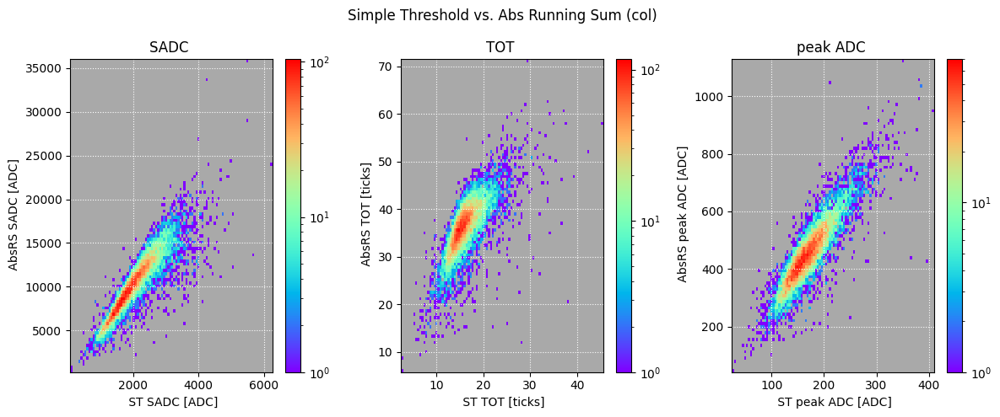

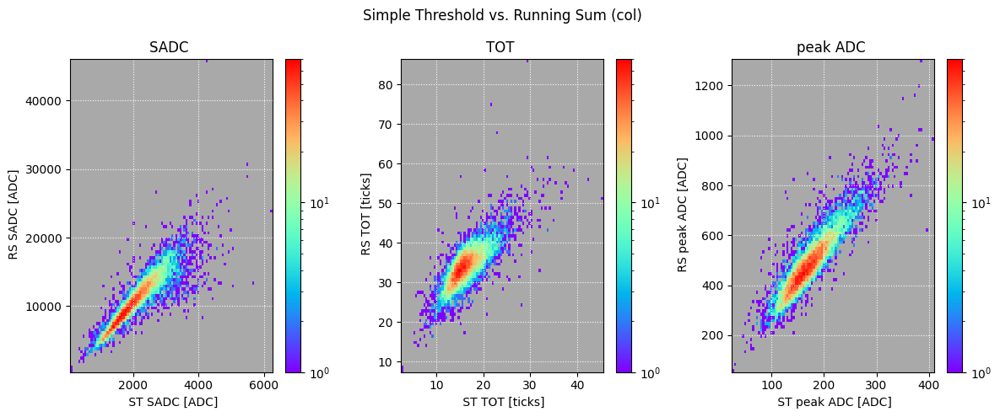

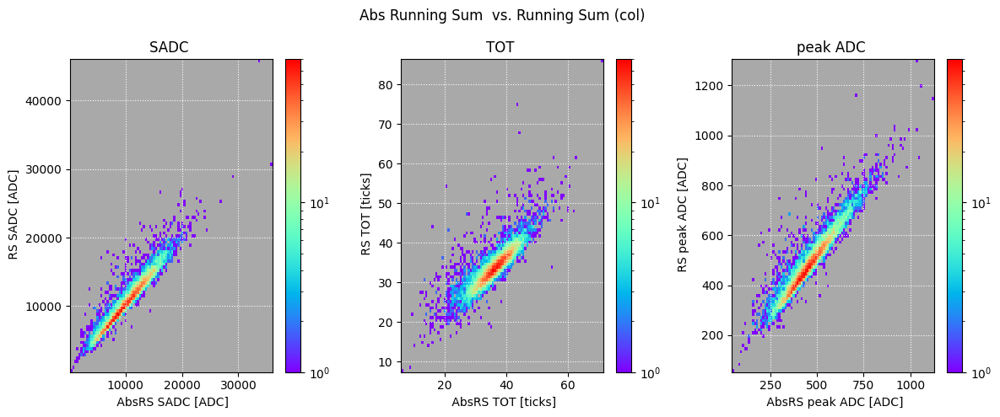

In [15]:
params = ['SADC','TOT','peakADC']
labels = ['SADC [ADC]', 'TOT [ticks]', 'peak ADC [ADC]']
titles = ['SADC ', 'TOT ', 'peak ADC ']

fig, ax = plt.subplots(1,3, figsize=(12,5))
for j, i in enumerate(params):
    x_vals = tps[(tps.TP_plane == 2) ].groupby('event')[f'TP_{i}'].mean()
    y_vals = ars[(ars.TP_plane == 2)].groupby('event')[f'TP_{i}'].mean()
    h = ax[j].hist2d(x_vals, y_vals, bins =(100,100), cmap='rainbow', norm = LogNorm())
    plt.colorbar(h[3], ax=ax[j])
    ax[j].set_xlabel(f" ST {labels[j]}")
    ax[j].set_ylabel(f" AbsRS {labels[j]}")
    ax[j].set_title(titles[j])



plt.suptitle("Simple Threshold vs. Abs Running Sum (col)")
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1,3, figsize=(12,5))
for j, i in enumerate(params):
    x_vals = tps[(tps.TP_plane == 2) ].groupby('event')[f'TP_{i}'].mean()
    y_vals = rs[(rs.TP_plane == 2) ].groupby('event')[f'TP_{i}'].mean()
    ax[j].hist2d(x_vals, y_vals, bins =(100,100), cmap='rainbow', norm = LogNorm())
    ax[j].set_xlabel(f" ST {labels[j]}")
    ax[j].set_ylabel(f" RS {labels[j]}")
    plt.colorbar(h[3], ax=ax[j])
    ax[j].set_title(titles[j])



plt.suptitle("Simple Threshold vs. Running Sum (col)")
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(1,3, figsize=(12,5))
for j, i in enumerate(params):
    x_vals = ars[(ars.TP_plane == 2) ].groupby('event')[f'TP_{i}'].mean()
    y_vals = rs[(rs.TP_plane == 2) ].groupby('event')[f'TP_{i}'].mean()
    ax[j].hist2d(x_vals, y_vals, bins =(100,100), cmap='rainbow', norm = LogNorm())
    ax[j].set_xlabel(f" AbsRS {labels[j]}")
    ax[j].set_ylabel(f" RS {labels[j]}")
    plt.colorbar(h[3], ax=ax[j])
    ax[j].set_title(titles[j])


plt.suptitle("Abs Running Sum  vs. Running Sum (col)")
plt.tight_layout()
plt.show()


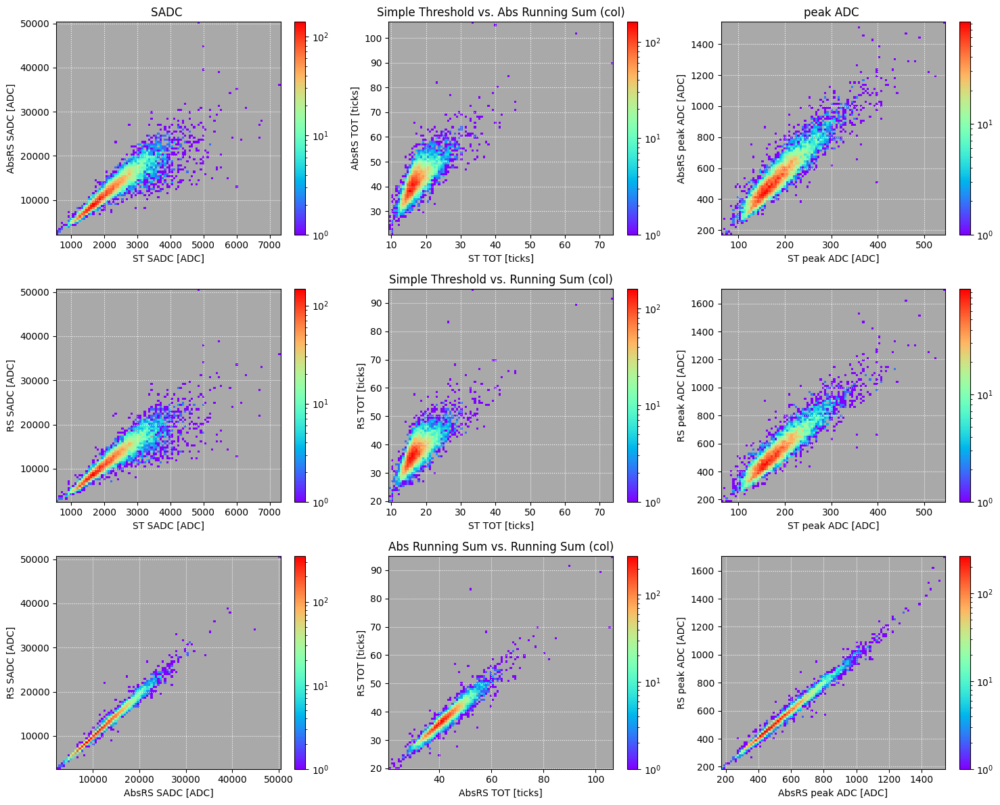

In [15]:
params = ['SADC', 'TOT', 'peakADC']
labels = ['SADC [ADC]', 'TOT [ticks]', 'peak ADC [ADC]']
titles = ['SADC ', 'TOT ', 'peak ADC ']

fig, ax = plt.subplots(3, 3, figsize=(15, 12))

for j, i in enumerate(params):
    x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
    y_vals_1 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
    h1 = ax[0, j].hist2d(x_vals_1, y_vals_1, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h1[3], ax=ax[0, j])
    ax[0, j].set_xlabel(f"ST {labels[j]}")
    ax[0, j].set_ylabel(f"AbsRS {labels[j]}")
    ax[0, j].set_title(titles[j])


for j, i in enumerate(params):
    x_vals_2 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
    y_vals_2 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
    h2 = ax[1, j].hist2d(x_vals_2, y_vals_2, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h2[3], ax=ax[1, j])
    ax[1, j].set_xlabel(f"ST {labels[j]}")
    ax[1, j].set_ylabel(f"RS {labels[j]}")


for j, i in enumerate(params):
    x_vals_3 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
    y_vals_3 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
    h3 = ax[2, j].hist2d(x_vals_3, y_vals_3, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h3[3], ax=ax[2, j])
    ax[2, j].set_xlabel(f"AbsRS {labels[j]}")
    ax[2, j].set_ylabel(f"RS {labels[j]}")


# Row titles
ax[0, 1].set_title("Simple Threshold vs. Abs Running Sum (col)")
ax[1, 1].set_title("Simple Threshold vs. Running Sum (col)")
ax[2, 1].set_title("Abs Running Sum vs. Running Sum (col)")

plt.tight_layout()
plt.show()


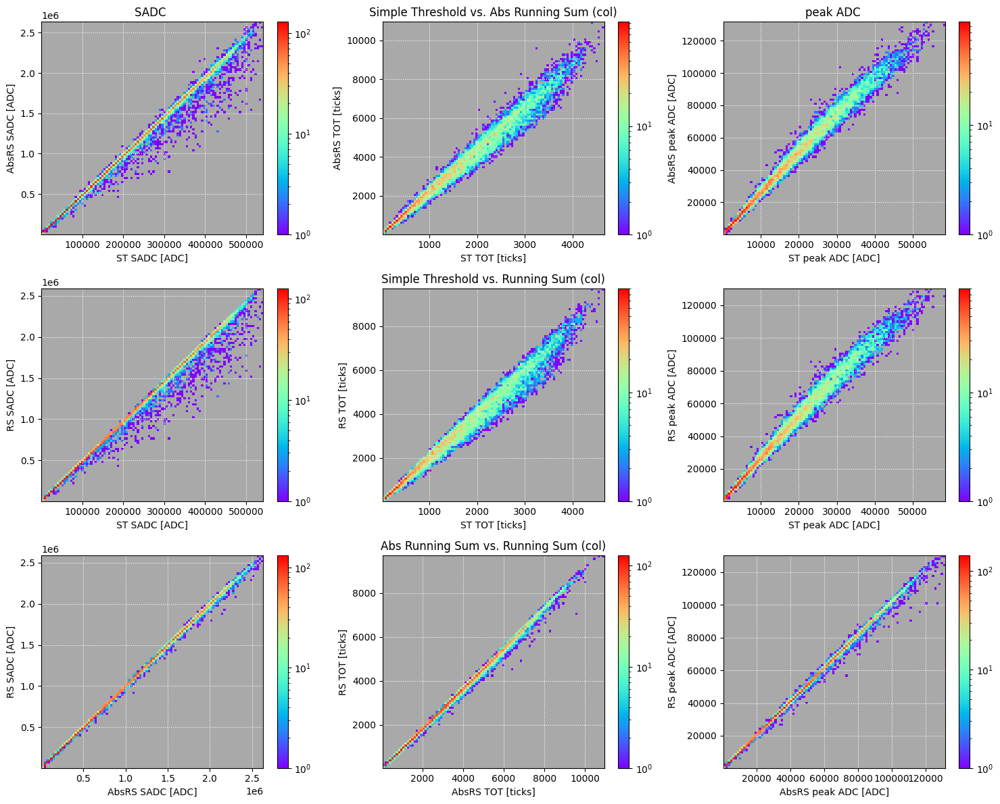

In [16]:
params = ['SADC', 'TOT', 'peakADC']
labels = ['SADC [ADC]', 'TOT [ticks]', 'peak ADC [ADC]']
titles = ['SADC ', 'TOT ', 'peak ADC ']

fig, ax = plt.subplots(3, 3, figsize=(15, 12))

for j, i in enumerate(params):
    x_vals_1 = tps[(tps.TP_plane == 2) ].groupby('event')[f'TP_{i}'].sum()
    y_vals_1 = ars[(ars.TP_plane == 2) ].groupby('event')[f'TP_{i}'].sum()
    h1 = ax[0, j].hist2d(x_vals_1, y_vals_1, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h1[3], ax=ax[0, j])
    ax[0, j].set_xlabel(f"ST {labels[j]}")
    ax[0, j].set_ylabel(f"AbsRS {labels[j]}")
    ax[0, j].set_title(titles[j])


for j, i in enumerate(params):
    x_vals_2 = tps[(tps.TP_plane == 2) ].groupby('event')[f'TP_{i}'].sum()
    y_vals_2 = rs[(rs.TP_plane == 2)].groupby('event')[f'TP_{i}'].sum()
    h2 = ax[1, j].hist2d(x_vals_2, y_vals_2, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h2[3], ax=ax[1, j])
    ax[1, j].set_xlabel(f"ST {labels[j]}")
    ax[1, j].set_ylabel(f"RS {labels[j]}")


for j, i in enumerate(params):
    x_vals_3 = ars[(ars.TP_plane == 2)].groupby('event')[f'TP_{i}'].sum()
    y_vals_3 = rs[(rs.TP_plane == 2) ].groupby('event')[f'TP_{i}'].sum()
    h3 = ax[2, j].hist2d(x_vals_3, y_vals_3, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h3[3], ax=ax[2, j])
    ax[2, j].set_xlabel(f"AbsRS {labels[j]}")
    ax[2, j].set_ylabel(f"RS {labels[j]}")


# Row titles
ax[0, 1].set_title("Simple Threshold vs. Abs Running Sum (col)")
ax[1, 1].set_title("Simple Threshold vs. Running Sum (col)")
ax[2, 1].set_title("Abs Running Sum vs. Running Sum (col)")

plt.tight_layout()
plt.show()


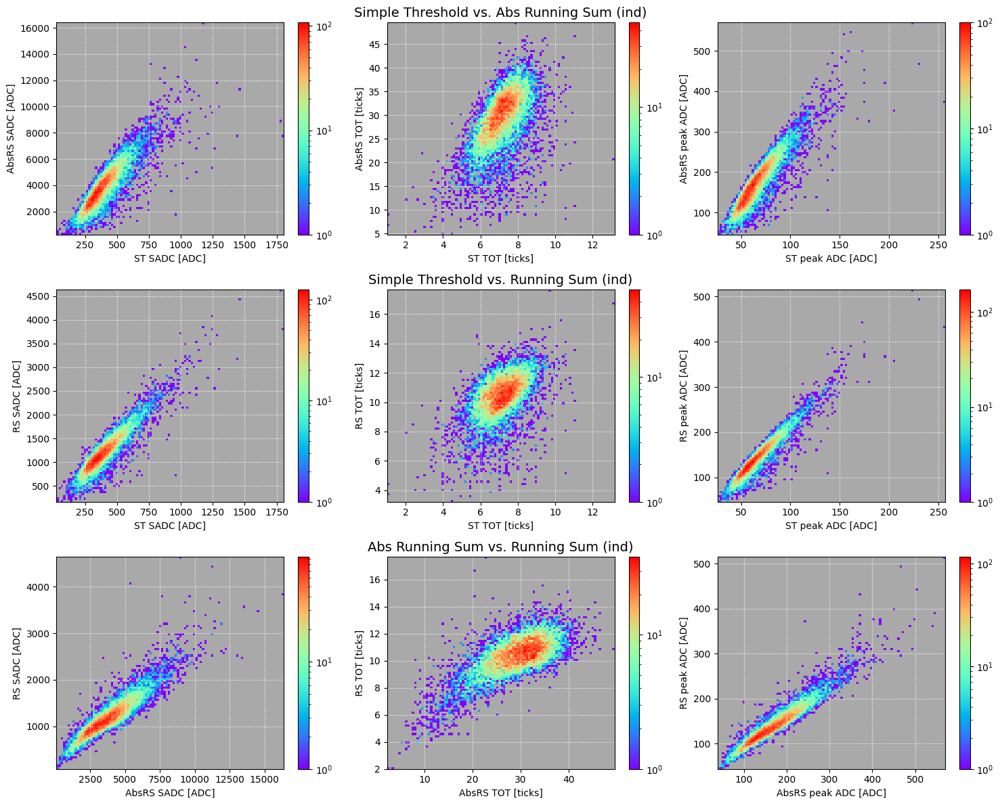

In [17]:
params = ['SADC', 'TOT', 'peakADC']
labels = ['SADC [ADC]', 'TOT [ticks]', 'peak ADC [ADC]']
titles = ['SADC ', 'TOT ', 'peak ADC ']

fig, ax = plt.subplots(3, 3, figsize=(15, 12))

for j, i in enumerate(params):
    x_vals = tps[(tps.TP_plane == 1) ].groupby('event')[f'TP_{i}'].mean()
    y_vals = ars[(ars.TP_plane ==1)  & 
                 (ars.event.isin(tps[(tps.TP_plane ==1) ].event.unique()))].groupby('event')[f'TP_{i}'].mean()
    h1 = ax[0, j].hist2d(x_vals, y_vals, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h1[3], ax=ax[0, j])
    ax[0, j].set_xlabel(f"ST {labels[j]}")
    ax[0, j].set_ylabel(f"AbsRS {labels[j]}")

ax[0, 1].set_title("Simple Threshold vs. Abs Running Sum (ind)", fontsize=14)

for j, i in enumerate(params):
    x_vals = tps[(tps.TP_plane== 1)].groupby('event')[f'TP_{i}'].mean()
    y_vals = rs[(rs.TP_plane ==1) & 
                (rs.event.isin(tps[(tps.TP_plane ==1) ].event.unique()))].groupby('event')[f'TP_{i}'].mean()
    h2 = ax[1, j].hist2d(x_vals, y_vals, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h2[3], ax=ax[1, j])
    ax[1, j].set_xlabel(f"ST {labels[j]}")
    ax[1, j].set_ylabel(f"RS {labels[j]}")


ax[1, 1].set_title("Simple Threshold vs. Running Sum (ind)", fontsize=14)

for j, i in enumerate(params):
    x_vals = ars[(ars.TP_plane ==1)  &(ars.event.isin(rs[(rs.TP_plane==1) ].event.unique())) ].groupby('event')[f'TP_{i}'].mean()
    y_vals = rs[(rs.TP_plane== 1)  &(rs.event.isin(ars[(ars.TP_plane==1) ].event.unique()))  ].groupby('event')[f'TP_{i}'].mean()
    h3 = ax[2, j].hist2d(x_vals, y_vals, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h3[3], ax=ax[2, j])
    ax[2, j].set_xlabel(f"AbsRS {labels[j]}")
    ax[2, j].set_ylabel(f"RS {labels[j]}")


ax[2, 1].set_title("Abs Running Sum vs. Running Sum (ind)", fontsize=14)


plt.tight_layout()
plt.show()


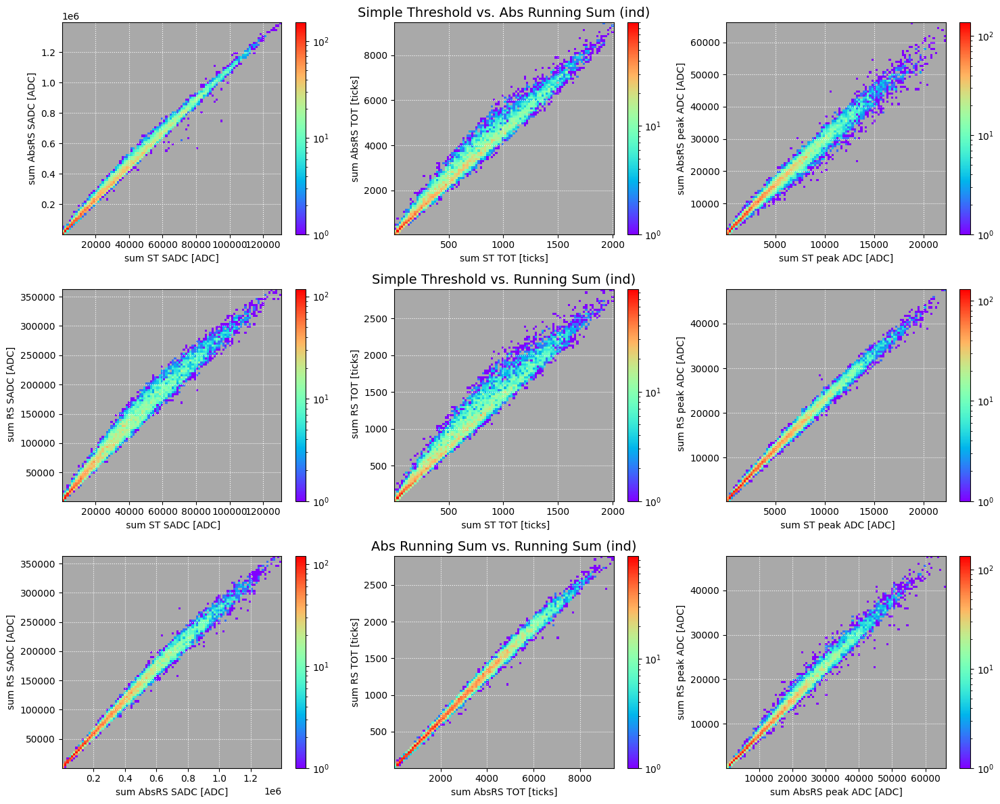

In [18]:
params = ['SADC', 'TOT', 'peakADC']
labels = ['SADC [ADC]', 'TOT [ticks]', 'peak ADC [ADC]']
titles = ['SADC ', 'TOT ', 'peak ADC ']

fig, ax = plt.subplots(3, 3, figsize=(15, 12))

for j, i in enumerate(params):
    x_vals = tps[(tps.TP_plane == 1) ].groupby('event')[f'TP_{i}'].sum()
    y_vals = ars[(ars.TP_plane ==1)  & 
                 (ars.event.isin(tps[(tps.TP_plane ==1) ].event.unique()))].groupby('event')[f'TP_{i}'].sum()
    h1 = ax[0, j].hist2d(x_vals, y_vals, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h1[3], ax=ax[0, j])
    ax[0, j].set_xlabel(f"sum ST {labels[j]}")
    ax[0, j].set_ylabel(f"sum AbsRS {labels[j]}")

ax[0, 1].set_title("Simple Threshold vs. Abs Running Sum (ind)", fontsize=14)

for j, i in enumerate(params):
    x_vals = tps[(tps.TP_plane== 1)].groupby('event')[f'TP_{i}'].sum()
    y_vals = rs[(rs.TP_plane ==1) & 
                (rs.event.isin(tps[(tps.TP_plane ==1) ].event.unique()))].groupby('event')[f'TP_{i}'].sum()
    h2 = ax[1, j].hist2d(x_vals, y_vals, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h2[3], ax=ax[1, j])
    ax[1, j].set_xlabel(f" sum ST {labels[j]}")
    ax[1, j].set_ylabel(f" sum RS {labels[j]}")


ax[1, 1].set_title("Simple Threshold vs. Running Sum (ind)", fontsize=14)

for j, i in enumerate(params):
    x_vals = ars[(ars.TP_plane ==1)  &(ars.event.isin(rs[(rs.TP_plane==1) ].event.unique())) ].groupby('event')[f'TP_{i}'].sum()
    y_vals = rs[(rs.TP_plane== 1)  &(rs.event.isin(ars[(ars.TP_plane==1) ].event.unique()))  ].groupby('event')[f'TP_{i}'].sum()
    h3 = ax[2, j].hist2d(x_vals, y_vals, bins=(100, 100), cmap='rainbow', norm=LogNorm())
    plt.colorbar(h3[3], ax=ax[2, j])
    ax[2, j].set_xlabel(f"sum AbsRS {labels[j]}")
    ax[2, j].set_ylabel(f"sum RS {labels[j]}")


ax[2, 1].set_title("Abs Running Sum vs. Running Sum (ind)", fontsize=14)


plt.tight_layout()
plt.show()


# Visible energy vs. particle energy for the different algs

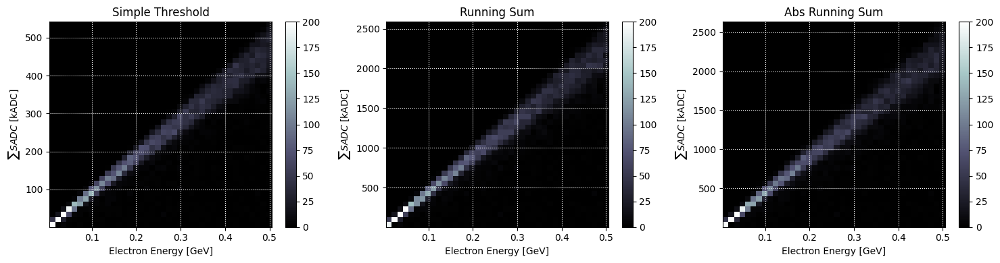

In [215]:
fig,ax = plt.subplots(1,3, figsize=(15,4))
algs = [tps, rs, ars]
labs = ['Simple Threshold', 'Running Sum', "Abs Running Sum"]
for i, d in enumerate(algs):
    y =d[(d.TP_plane == 2) & d.event.isin(mc.event.unique()) ]
    mcf = mc[mc.event.isin(y.event.unique())]
    y_vals_1 = y.groupby('event')[f'TP_SADC'].sum()/1e3
    s = ax[i].hist2d(mcf.Eng, y_vals_1,bins =(40,40), cmap='bone', vmax =200)#, 
                #c= mc[mc.event.isin(y.event.unique())].startX, s= 1, cmap='rainbow')
    ax[i].set_xlabel("Electron Energy [GeV]")
    cbar = plt.colorbar(s[3], ax=ax[i])
    ax[i].set_ylabel(r"$\sum SADC$ [kADC]")
    ax[i].set_title(labs[i])
plt.tight_layout()

# Discrepancy in TOT

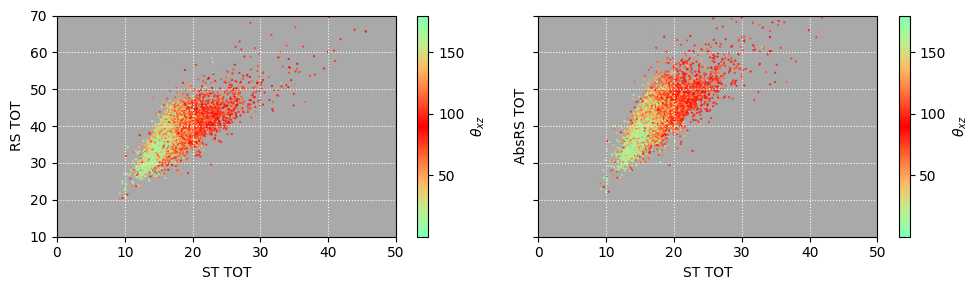

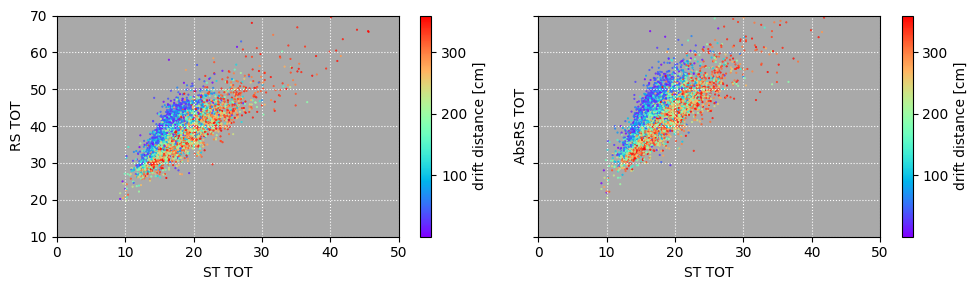

In [354]:

fig,ax = plt.subplots(1,2,figsize=(10,3), sharey=True, sharex=True)
i = 'TOT'
x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[0].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_xz, s= 1, marker='.', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"$\theta_{xz}$")
ax[0].set_xlabel("ST TOT")
ax[0].set_ylabel("RS TOT")

x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[1].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_xz, s= 1, marker='.', cmap =cmap3)
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"$\theta_{xz}$")
ax[1].set_xlabel("ST TOT")
ax[1].set_ylabel("AbsRS TOT")
ax[1].set_xlim(0,50)
ax[1].set_ylim(10,70)
plt.tight_layout()




colors = ["yellow", "r", "b"]
cmap2 = LinearSegmentedColormap.from_list("custom_cmap", colors)

fig,ax = plt.subplots(1,2,figsize=(10,3), sharey=True, sharex=True)
i = 'TOT'
x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[0].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].startX, s= 1, marker='.', cmap = 'rainbow')
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"drift distance [cm]")
ax[0].set_xlabel("ST TOT")
ax[0].set_ylabel("RS TOT")

x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[1].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].startX, s= 1, marker='.', cmap = 'rainbow')
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"drift distance [cm]")
ax[1].set_xlabel("ST TOT")
ax[1].set_ylabel("AbsRS TOT")
ax[1].set_xlim(0,50)
ax[1].set_ylim(10,70)
plt.tight_layout()



## Discrepancy in  SADC 

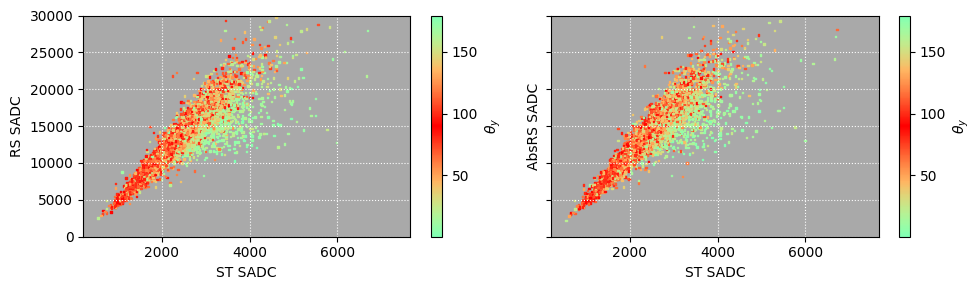

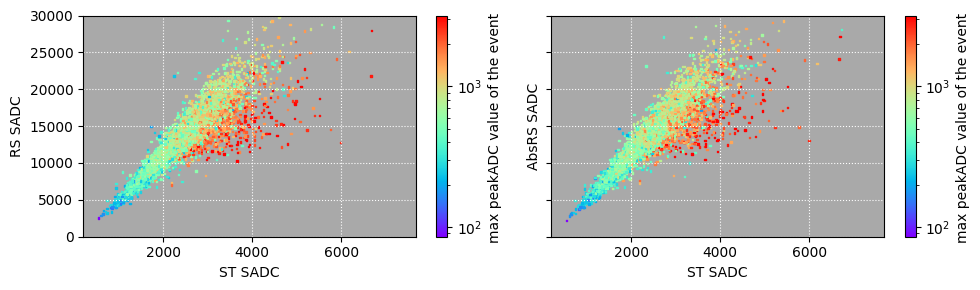

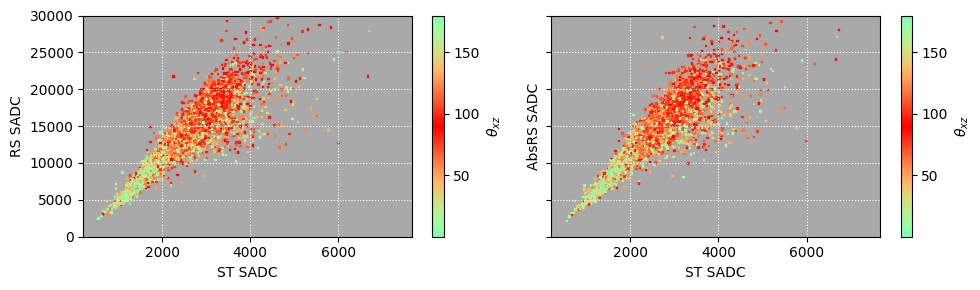

In [19]:


fig,ax = plt.subplots(1,2,figsize=(10,3), sharey=True)
i = 'SADC'
x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[0].scatter(x_vals_1, y_vals_1, 
                  c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_y, 
                  s= 1, marker=',', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"$\theta_{y}$")
ax[0].set_xlabel("ST SADC")
ax[0].set_ylabel("RS SADC")
ax[0].set_ylim(0,30e3)

x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[1].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_y, s= 1, marker=',', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"$\theta_{y}$")
ax[1].set_xlabel("ST SADC")
ax[1].set_ylabel("AbsRS SADC")
plt.tight_layout()





fig,ax = plt.subplots(1,2,figsize=(10,3), sharey=True)
i = 'SADC'
x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[0].scatter(x_vals_1, y_vals_1, 
                  #c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_y, 
                  c= tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event').TP_peakADC.max(), norm=LogNorm(),
                  s= 1, marker=',', cmap = 'rainbow')
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"max peakADC value of the event ")
ax[0].set_xlabel("ST SADC")
ax[0].set_ylabel("RS SADC")
ax[0].set_ylim(0,30e3)

x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[1].scatter(x_vals_1, y_vals_1,
                   c= tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event').TP_peakADC.max(), norm =LogNorm(),
                   s= 1, marker=',', cmap = 'rainbow')
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"max peakADC value of the event ")
ax[1].set_xlabel("ST SADC")
ax[1].set_ylabel("AbsRS SADC")
plt.tight_layout()





fig,ax = plt.subplots(1,2,figsize=(10,3), sharey=True)
i = 'SADC'
x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[0].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_xz, s= 1, marker=',', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"$\theta_{xz}$")
ax[0].set_xlabel("ST SADC")
ax[0].set_ylabel("RS SADC")
ax[0].set_ylim(0,30e3)

x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[1].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_xz, s= 1, marker=',', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"$\theta_{xz}$")
ax[1].set_xlabel("ST SADC")
ax[1].set_ylabel("AbsRS SADC")
plt.tight_layout()



# Discrepancy in peak ADC 

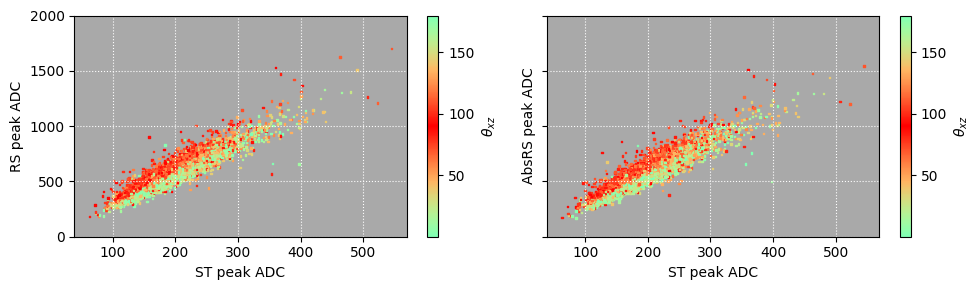

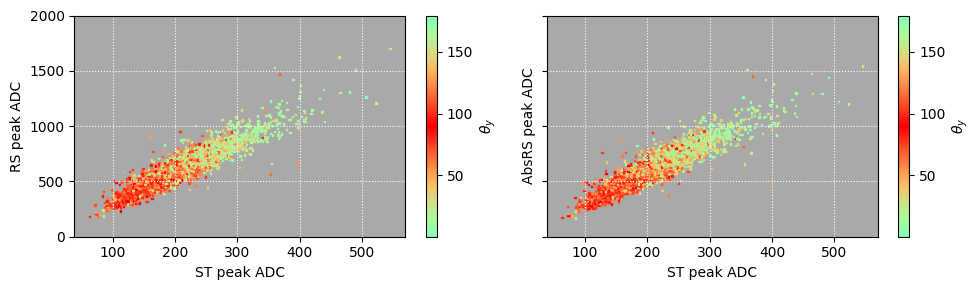

In [20]:

fig,ax = plt.subplots(1,2,figsize=(10,3), sharey=True)
i = 'peakADC'
x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[0].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_xz, s= 1, marker=',', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"$\theta_{xz}$")
ax[0].set_xlabel("ST peak ADC")
ax[0].set_ylabel("RS peak ADC")
ax[0].set_ylim(0,2000)

x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[1].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_xz, s= 1, marker=',', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"$\theta_{xz}$")
ax[1].set_xlabel("ST peak ADC")
ax[1].set_ylabel("AbsRS peak ADC")
plt.tight_layout()


fig,ax = plt.subplots(1,2,figsize=(10,3), sharey=True)
i = 'peakADC'
x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = rs[(rs.TP_plane == 2) & (rs.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[0].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_y, s= 1, marker=',', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"$\theta_{y}$")
ax[0].set_xlabel("ST peak ADC")
ax[0].set_ylabel("RS peak ADC")
ax[0].set_ylim(0,2000)

x_vals_1 = tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()
y_vals_1 = ars[(ars.TP_plane == 2) & (ars.TP_signal == 1)].groupby('event')[f'TP_{i}'].mean()

s = ax[1].scatter(x_vals_1, y_vals_1, c= mc[mc.event.isin(tps[(tps.TP_plane == 2) & (tps.TP_signal == 1)].event.unique())].theta_y, s= 1, marker=',', cmap = cmap3)
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"$\theta_{y}$")
ax[1].set_xlabel("ST peak ADC")
ax[1].set_ylabel("AbsRS peak ADC")
plt.tight_layout()



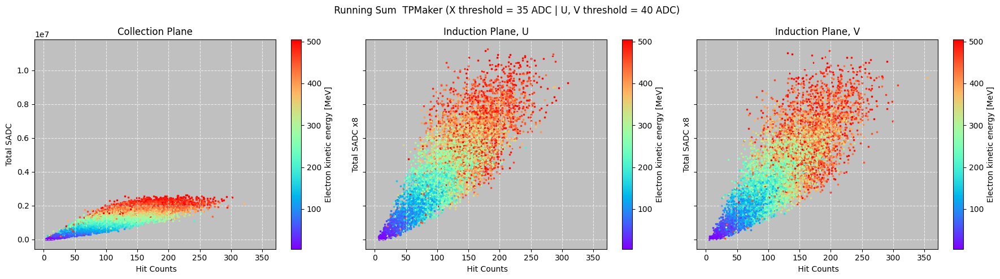

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True, sharex=True)

cmap = 'rainbow'
# X
axes[0].set_title("Collection Plane")
axes[0].scatter(tps2.groupby('event').size(), tps2.groupby('event').TP_SADC.sum() , s=2, marker='s', c=mc.Ekin, cmap=cmap)
axes[0].set_xlabel(" Hit Counts")
axes[0].set_ylabel("Total SADC")
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label("Electron kinetic energy [MeV]")

#U
axes[1].set_title("Induction Plane, U")
axes[1].scatter(tps0.groupby('event').size(), tps0.groupby('event').TP_SADC.sum() *8, s=2, marker='s', c=mc[mc.event.isin(tps0.event.unique())].Ekin, cmap=cmap)
axes[1].set_xlabel(" Hit Counts")
axes[1].set_ylabel("Total SADC x8")
cbar1 = plt.colorbar(axes[1].collections[0], ax=axes[1])
cbar1.set_label("Electron kinetic energy [MeV]")

#V
axes[2].set_title("Induction Plane, V")
axes[2].scatter(tps1.groupby('event').size(), tps1.groupby('event').TP_SADC.sum() *8, s=2, marker='s', c=mc[mc.event.isin(tps1.event.unique())].Ekin, cmap=cmap)
axes[2].set_xlabel(" Hit Counts")
axes[2].set_ylabel("Total SADC x8")
cbar2 = plt.colorbar(axes[2].collections[0], ax=axes[2])
cbar2.set_label("Electron kinetic energy [MeV]")

for i in [0,1,2]:
    axes[i].grid(alpha=0.7,color='white', linestyle='--')
    axes[i].set_facecolor(facecolor)


plt.suptitle(" Running Sum  TPMaker (X threshold = 35 ADC | U, V threshold = 40 ADC)")
plt.tight_layout()

plt.show()


# Collection vs. Induction information | AbsRS

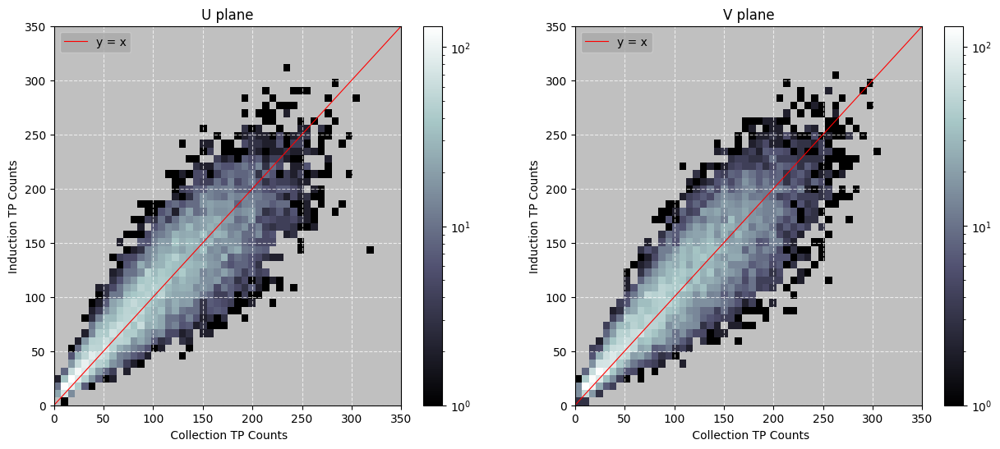

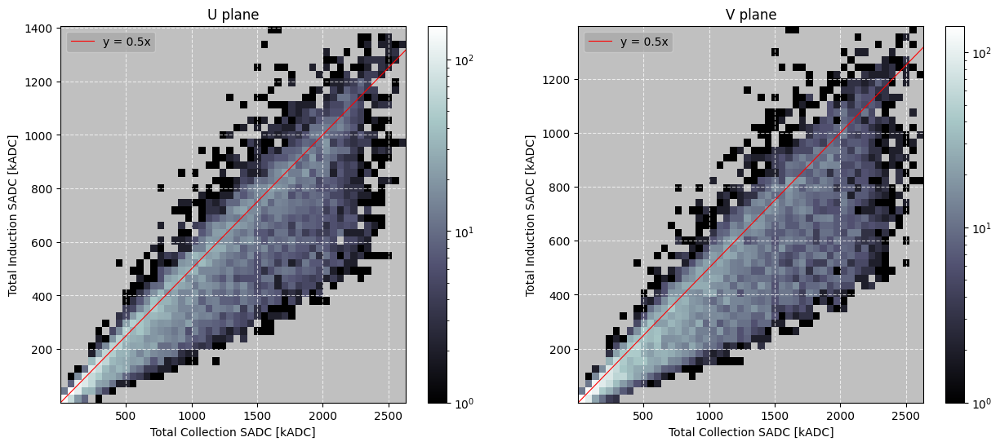

In [196]:

tps2 = ars[(ars.TP_plane==2)]
tps1 = ars[ars.TP_plane==1 ]
tps0 = ars[ars.TP_plane==0]


ind_type = [tps0, tps1]
label = ['U plane', 'V plane']
cmap = 'bone'; b = 50

fig, ax = plt.subplots(1,2, figsize=(15,6))
for i, plane in enumerate(ind_type):
    # Ensure all events in tps2 are represented, fill missing events with zero
    plane_counts = plane.groupby('event').size().reindex(tps2['event'].unique(), fill_value=0)    
    h = ax[i].hist2d(tps2.groupby('event').size(), plane_counts, range=[(0, 350), (0, 350)], bins=(b, b), cmap=cmap, norm=LogNorm())
    ax[i].plot([0, 350], [0, 350], color='r', linewidth=0.8, linestyle='solid', label = 'y = x')
    ax[i].set_xlabel(" Collection TP Counts")
    ax[i].set_ylabel( "Induction TP Counts")
    plt.colorbar(h[3], ax=ax[i])
    ax[i].set_title(f'{label[i]}')
    ax[i].grid(alpha=0.7,color='white', linestyle='--')
    ax[i].set_facecolor(facecolor)
    ax[i].legend(loc='upper left')
plt.show()


fig, ax = plt.subplots(1,2, figsize=(15,6))
for i, plane in enumerate(ind_type):
    # Ensure all events in tps2 are represented, fill missing events with zero
    plane_counts = plane.groupby('event').TP_SADC.sum().reindex(tps2['event'].unique(), fill_value=0)
    h = ax[i].hist2d(tps2.groupby('event').TP_SADC.sum()/1e3, plane_counts/1e3,bins=(b, b), cmap=cmap, norm=LogNorm())
    ax[i].plot([0, 35e6], [0, 35e6/2], color='r', linewidth=0.8, linestyle='solid',label = 'y = 0.5x')
    ax[i].set_xlabel("Total Collection SADC [kADC]")
    ax[i].set_ylabel("Total Induction SADC [kADC]")
    plt.colorbar(h[3], ax=ax[i])
    ax[i].set_title(f'{label[i]}')
    ax[i].grid(alpha=0.7,color='white', linestyle='--')
    ax[i].set_facecolor(facecolor)
    ax[i].legend(loc='upper left')
plt.show()

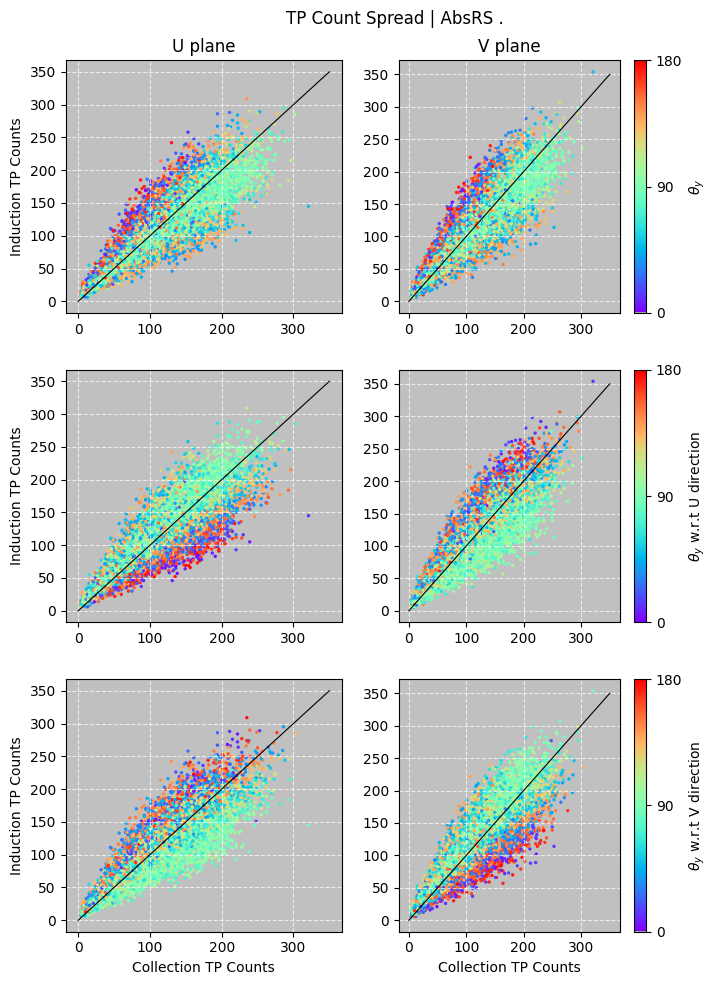

In [23]:

ind_type = [tps0, tps1]
label = ['U plane', 'V plane']
clabel = [r'$\theta_y$', r'$\theta_y$ w.r.t U direction', r'$\theta_y$ w.r.t V direction']
data = [mc.theta_y, mc.theta_yU, mc.theta_yV]

fig, ax = plt.subplots(3, 2, figsize=(8, 10), dpi=100)
for j, d in enumerate(data):
    for i, plane in enumerate(ind_type):
        plane_counts = plane.groupby('event').size().reindex(tps2['event'].unique(), fill_value=0)
        sc = ax[j, i].scatter(tps2.groupby('event').size(), plane_counts, c=d, s=2, cmap='rainbow')
        ax[j, i].plot([0, 350], [0, 350], color='k', linewidth=0.8)
        ax[2, i].set_xlabel("Collection TP Counts")
        ax[j, 0].set_ylabel("Induction TP Counts")
        ax[j, i].set_title(f'{label[i]}' if j == 0 else '')
        ax[j, i].grid(alpha=0.7, color='white', linestyle='--')
        ax[j, i].set_facecolor(facecolor)
    
    cbar = plt.colorbar(sc, ax=ax[j, 1], orientation='vertical',)
    cbar.set_ticks([0, 90, 180])
    cbar.set_label(clabel[j])
plt.suptitle("TP Count Spread | AbsRS .")

plt.tight_layout(w_pad=2, h_pad=2)
plt.subplots_adjust(right=0.85)
plt.show()

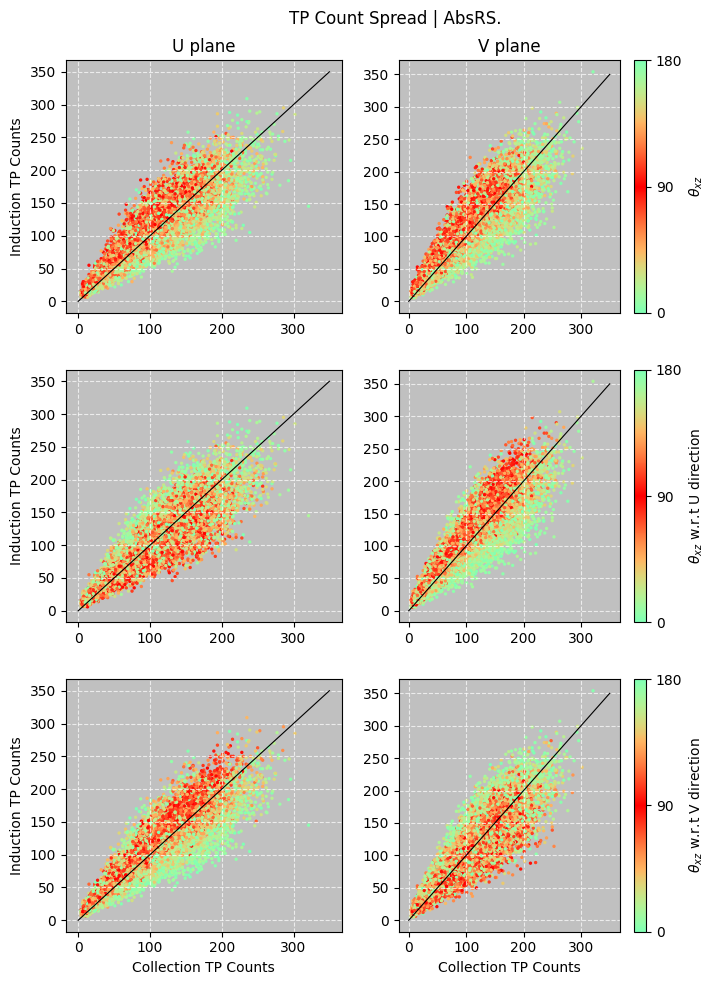

In [24]:

ind_type = [tps0, tps1]
label = ['U plane', 'V plane']
clabel = [r'$\theta_{xz}$', r'$\theta_{xz}$ w.r.t U direction', r'$\theta_{xz}$ w.r.t V direction']
data = [mc.theta_xz, mc.theta_xzU, mc.theta_xzV]

fig, ax = plt.subplots(3, 2, figsize=(8, 10), dpi=100)
for j, d in enumerate(data):
    for i, plane in enumerate(ind_type):
        plane_counts = plane.groupby('event').size().reindex(tps2['event'].unique(), fill_value=0)
        sc = ax[j, i].scatter(tps2.groupby('event').size(), plane_counts, c=d, s=2, cmap=cmap3)
        ax[j, i].plot([0, 350], [0, 350], color='k', linewidth=0.8)
        ax[2, i].set_xlabel("Collection TP Counts")
        ax[j, 0].set_ylabel("Induction TP Counts")
        ax[j, i].set_title(f'{label[i]}' if j == 0 else '')
        ax[j, i].grid(alpha=0.7, color='white', linestyle='--')
        ax[j, i].set_facecolor(facecolor)
    
    cbar = plt.colorbar(sc, ax=ax[j, 1], orientation='vertical',)
    cbar.set_ticks([0, 90, 180])
    cbar.set_label(clabel[j])

plt.suptitle("TP Count Spread | AbsRS.")
plt.tight_layout(w_pad=2, h_pad=2)
plt.subplots_adjust(right=0.85)
plt.show()

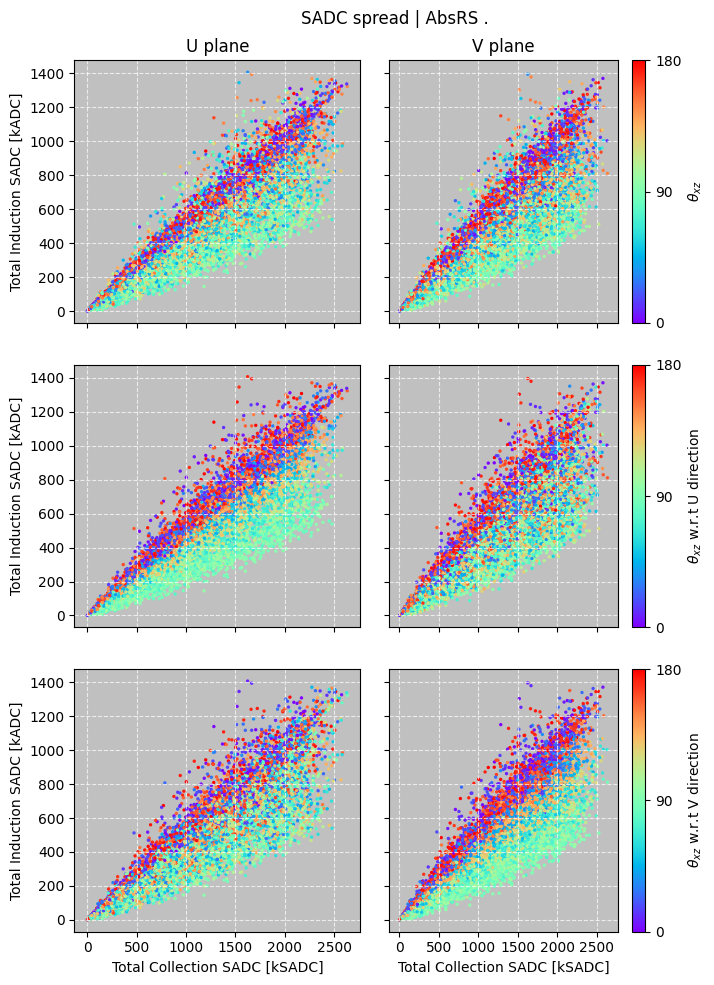

In [25]:
ind_type = [tps0, tps1]
label = ['U plane', 'V plane']
clabel = [r'$\theta_{xz}$', r'$\theta_{xz}$ w.r.t U direction', r'$\theta_{xz}$ w.r.t V direction']
data = [mc.theta_xz, mc.theta_xzU, mc.theta_xzV]

fig, ax = plt.subplots(3, 2, figsize=(8, 10), dpi=100, sharex=True, sharey = True)
for j, d in enumerate(data):
    for i, plane in enumerate(ind_type):
        plane_counts = plane.groupby('event').TP_SADC.sum().reindex(tps2['event'].unique(), fill_value=0)
        sc = ax[j, i].scatter(tps2.groupby('event').TP_SADC.sum()/1000, plane_counts/1000, c=d, s=2, cmap='rainbow')
        ax[2, i].set_xlabel("Total Collection SADC [kSADC]")
        ax[j, 0].set_ylabel("Total Induction SADC [kADC]")
        ax[j, i].set_title(f'{label[i]}' if j == 0 else '')
        ax[j, i].grid(alpha=0.7, color='white', linestyle='--')
        ax[j, i].set_facecolor(facecolor)
    
    cbar = plt.colorbar(sc, ax=ax[j, 1], orientation='vertical',)
    cbar.set_ticks([0, 90, 180])
    cbar.set_label(clabel[j])
plt.suptitle("SADC spread | AbsRS .")

plt.tight_layout(w_pad=2, h_pad=2)
plt.subplots_adjust(right=0.85)
plt.show()

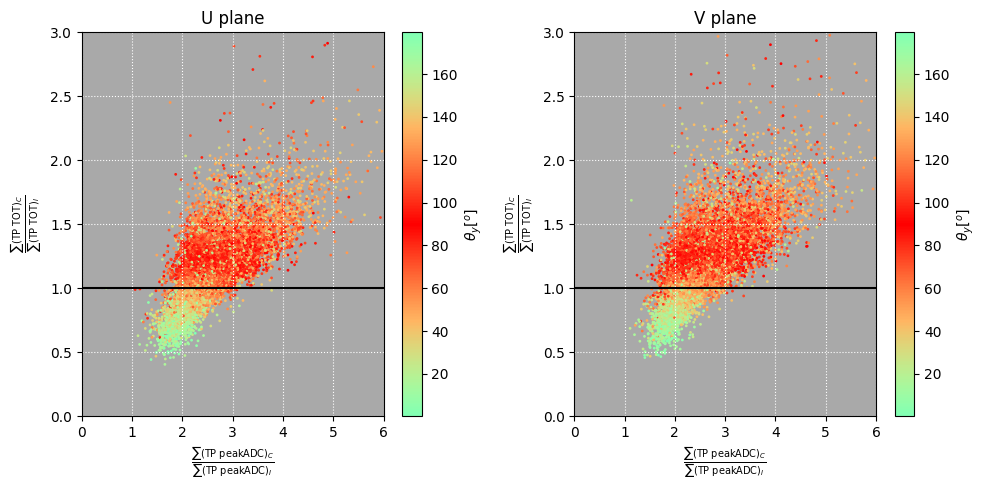

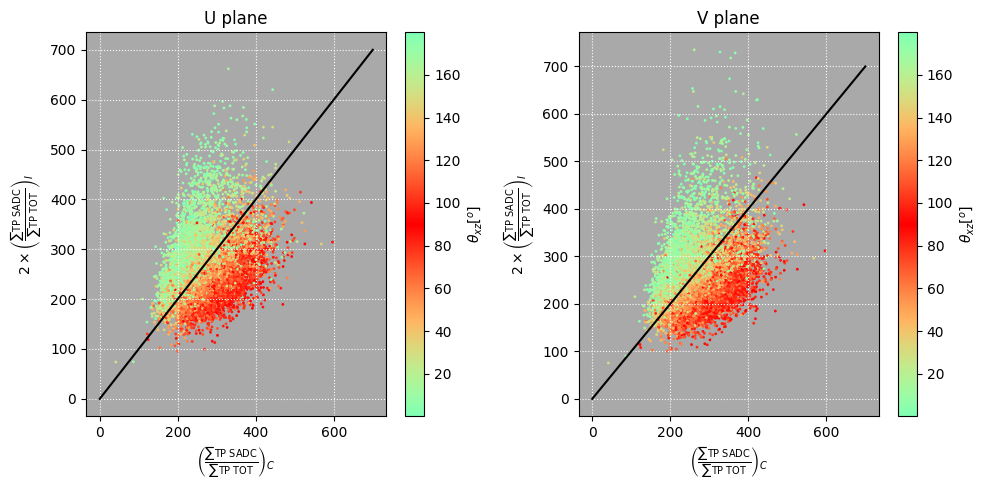

In [26]:
fig, ax = plt.subplots(1,2,figsize=(10,5))
s = ax[0].scatter(tps2.groupby('event').TP_peakADC.sum()/ tps0.groupby('event').TP_peakADC.sum(), tps2.groupby('event').TP_TOT.sum()/ tps0.groupby('event').TP_TOT.sum(), c= mc.theta_y, cmap = cmap3,s=1)
cbar = plt.colorbar(s, ax = ax[0])
cbar.set_label(r"$\theta_{y} [^{o}]$")

title=['U plane', 'V plane']

s = ax[1].scatter(tps2.groupby('event').TP_peakADC.sum()/ tps1.groupby('event').TP_peakADC.sum(), tps2.groupby('event').TP_TOT.sum()/ tps1.groupby('event').TP_TOT.sum(), c= mc.theta_y, cmap = cmap3,s=1)
cbar = plt.colorbar(s, ax = ax[1])
cbar.set_label(r"$\theta_{y} [^{o}]$")

for i in [0,1]:
    ax[i].set_ylim(0,3)
    ax[i].set_xlim(0,6)
    ax[i].plot([0,6],[1,1], 'k-')
    ax[i].set_xlabel(r"$\frac{\sum (\text{TP peakADC})_{C}}{\sum (\text{TP peakADC})_{I}} $")
    ax[i].set_ylabel(r"$\frac{\sum (\text{TP TOT})_{C}}{\sum (\text{TP TOT})_{I}} $")
    ax[i].set_title(title[i])
plt.tight_layout()
plt.show()





fig, ax = plt.subplots(1,2,figsize=(10,5))
s = ax[0].scatter(tps2.groupby('event').TP_SADC.sum()/ tps2.groupby('event').TP_TOT.sum(), (tps0.groupby('event').TP_SADC.sum()/ tps0.groupby('event').TP_TOT.sum())*2, c= mc.theta_xz, cmap = cmap3,s=1)
cbar = plt.colorbar(s, ax = ax[0])
cbar.set_label(r"$\theta_{xz} [^{o}]$")

s = ax[1].scatter(tps2.groupby('event').TP_SADC.sum()/ tps2.groupby('event').TP_TOT.sum(), (tps1.groupby('event').TP_SADC.sum()/ tps1.groupby('event').TP_TOT.sum())*2, c= mc.theta_xz, cmap = cmap3,s=1)
cbar = plt.colorbar(s, ax = ax[1])
cbar.set_label(r"$\theta_{xz} [^{o}]$")
for i in [0,1]:
    ax[i].plot([0,700],[0,700], 'k-')
    ax[i].set_xlabel(r"$\left( \frac{\sum \text{TP SADC}}{\sum \text{TP TOT}}\right)_{C} $")
    ax[i].set_ylabel(r"$ 2 \times \left( \frac{\sum \text{TP SADC}}{\sum \text{TP TOT}}\right)_{I} $")
    ax[i].set_title(title[i])

plt.tight_layout()
plt.show()



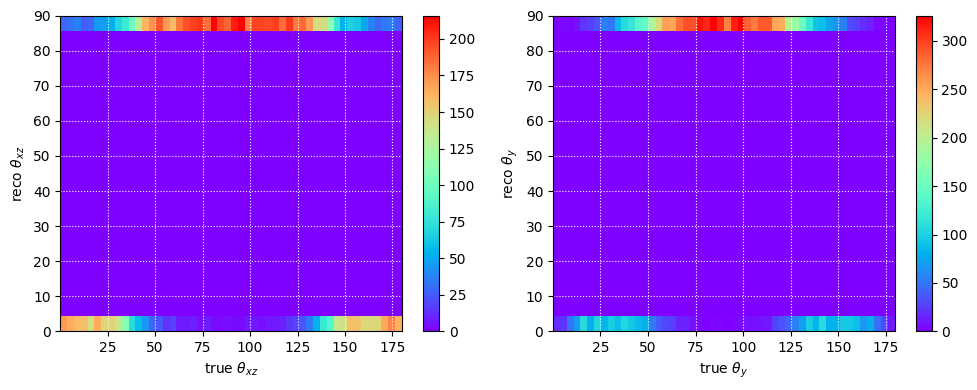

,event,n_TPs,TP_channel,TP_startT,TP_peakT,TP_peakADC,TP_SADC,TP_TOT,TP_plane,TP_TPC,TP_trueX,TP_trueY,TP_trueZ,TP_signal,theta_y,theta_xz
0,901,569,2367,3221,3222,33,65,2,2,1,-1,-1,-1,0,90,90
1,901,286,12933,2488,2515,94,3457,53,0,10,204,291,550,1,90,90
2,901,286,12932,2473,2501,117,4041,58,0,10,203,292,550,1,90,90
3,901,286,12931,2465,2487,209,5896,50,0,10,202,293,550,1,90,90
4,901,286,12930,2454,2486,111,4192,47,0,10,201,294,550,1,90,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3195023,47430,172,13858,904,914,65,956,19,1,10,75,307,526,1,90,90
3195024,47430,172,13857,901,912,136,2054,24,1,10,75,307,526,1,90,90
3195025,47430,172,13855,1040,1040,36,36,1,1,10,-1,-1,-1,0,90,90
3195026,47430,172,18715,5646,5646,36,36,1,0,14,-1,-1,-1,0,90,90


In [27]:
def GetDirection(df, correction_factor):

    #a function to determine the rough orientation of the event wrt. the collection plane (obtaining theta_y and theta_xz)
    #Group TPs by plane ID
    tps2 = df[df.TP_plane==2]
    tps0 = df[df.TP_plane==0]
    tps1 = df[df.TP_plane==1]

    sum_TOT_col = tps2.groupby('event').TP_TOT.sum()
    sum_TOT_ind = tps1.groupby('event').TP_TOT.sum()

    sum_SADC_col = tps2.groupby('event').TP_SADC.sum()
    sum_SADC_ind = tps1.groupby('event').TP_SADC.sum() 

    #ratio between collection and induction TOTs to get theta_y 
    TOT_ratio = sum_TOT_col/sum_TOT_ind
    df['theta_y'] = df['event'].apply(lambda event: 0 if TOT_ratio.get(event, 0) < 1 else 90)

    #ratio between SADC and TOT in collection plane to get theta_xz
    energy_to_tot_ratio_c = sum_SADC_col/sum_TOT_col
    energy_to_tot_ratio_i = (sum_SADC_ind/sum_TOT_ind) * correction_factor

    ratios =  energy_to_tot_ratio_c /energy_to_tot_ratio_i 

    df['theta_xz'] = df['event'].apply(lambda event: 0 if ratios.get(event, 0) < 1 else 90)

    return df

ars_reco = GetDirection(ars, 2)

fig ,ax = plt.subplots(1,2,figsize=(10,4))
h = ax[0].hist2d(mc.theta_xz, ars_reco.groupby('event').theta_xz.mean(), bins=(50,20), cmap='rainbow')
plt.colorbar(h[3],ax=ax[0])
ax[0].set_xlabel(r"true $\theta_{xz}$")
ax[0].set_ylabel(r"reco $\theta_{xz}$")

h = ax[1].hist2d(mc.theta_y, ars_reco.groupby('event').theta_y.mean(), bins=(50,20), cmap='rainbow')
plt.colorbar(h[3],ax=ax[1])
ax[1].set_xlabel(r"true $\theta_{y}$")
ax[1].set_ylabel(r"reco $\theta_{y}$")
plt.tight_layout()
plt.show()

ars_reco

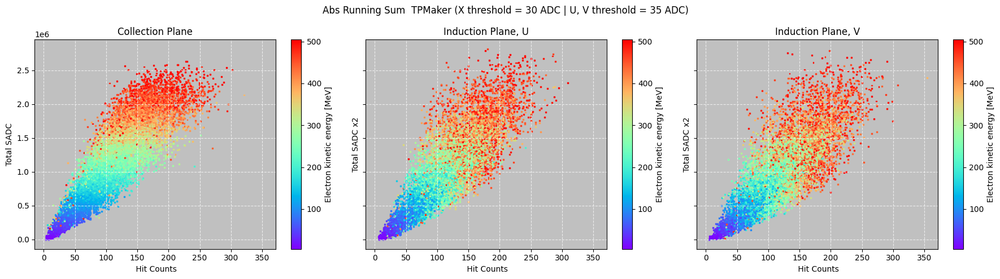

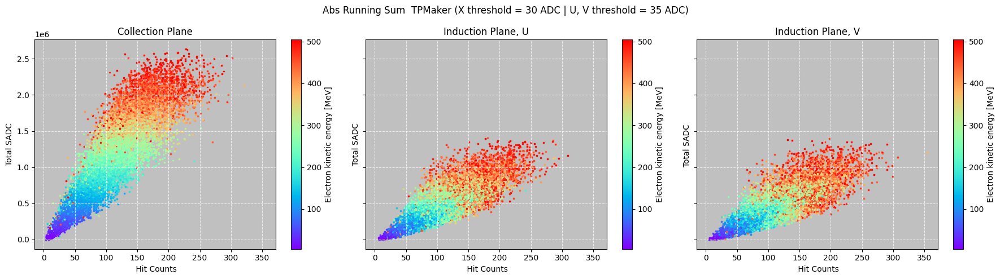

In [28]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True, sharex=True)

cmap = 'rainbow'
# X
axes[0].set_title("Collection Plane")
axes[0].scatter(tps2.groupby('event').size(), tps2.groupby('event').TP_SADC.sum() , s=2, marker='s', c=mc.Ekin, cmap=cmap)
axes[0].set_xlabel(" Hit Counts")
axes[0].set_ylabel("Total SADC")
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label("Electron kinetic energy [MeV]")

#U
axes[1].set_title("Induction Plane, U")
axes[1].scatter(tps0.groupby('event').size(), tps0.groupby('event').TP_SADC.sum() *2, s=2, marker='s', c=mc[mc.event.isin(tps0.event.unique())].Ekin, cmap=cmap)
axes[1].set_xlabel(" Hit Counts")
axes[1].set_ylabel("Total SADC x2")
cbar1 = plt.colorbar(axes[1].collections[0], ax=axes[1])
cbar1.set_label("Electron kinetic energy [MeV]")

#V
axes[2].set_title("Induction Plane, V")
axes[2].scatter(tps1.groupby('event').size(), tps1.groupby('event').TP_SADC.sum() *2, s=2, marker='s', c=mc[mc.event.isin(tps1.event.unique())].Ekin, cmap=cmap)
axes[2].set_xlabel(" Hit Counts")
axes[2].set_ylabel("Total SADC x2")
cbar2 = plt.colorbar(axes[2].collections[0], ax=axes[2])
cbar2.set_label("Electron kinetic energy [MeV]")

for i in [0,1,2]:
    axes[i].grid(alpha=0.7,color='white', linestyle='--')
    axes[i].set_facecolor(facecolor)


plt.suptitle("Abs Running Sum  TPMaker (X threshold = 30 ADC | U, V threshold = 35 ADC)")
plt.tight_layout()

plt.show()


fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True, sharex=True)

cmap = 'rainbow'
# X
axes[0].set_title("Collection Plane")
axes[0].scatter(tps2.groupby('event').size(), tps2.groupby('event').TP_SADC.sum() , s=2, marker='s', c=mc.Ekin, cmap=cmap)
axes[0].set_xlabel(" Hit Counts")
axes[0].set_ylabel("Total SADC")
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label("Electron kinetic energy [MeV]")

#U
axes[1].set_title("Induction Plane, U")
axes[1].scatter(tps0.groupby('event').size(), tps0.groupby('event').TP_SADC.sum() , s=2, marker='s', c=mc[mc.event.isin(tps0.event.unique())].Ekin, cmap=cmap)
axes[1].set_xlabel(" Hit Counts")
axes[1].set_ylabel("Total SADC")
cbar1 = plt.colorbar(axes[1].collections[0], ax=axes[1])
cbar1.set_label("Electron kinetic energy [MeV]")

#V
axes[2].set_title("Induction Plane, V")
axes[2].scatter(tps1.groupby('event').size(), tps1.groupby('event').TP_SADC.sum() , s=2, marker='s', c=mc[mc.event.isin(tps1.event.unique())].Ekin, cmap=cmap)
axes[2].set_xlabel(" Hit Counts")
axes[2].set_ylabel("Total SADC ")
cbar2 = plt.colorbar(axes[2].collections[0], ax=axes[2])
cbar2.set_label("Electron kinetic energy [MeV]")

for i in [0,1,2]:
    axes[i].grid(alpha=0.7,color='white', linestyle='--')
    axes[i].set_facecolor(facecolor)


plt.suptitle("Abs Running Sum  TPMaker (X threshold = 30 ADC | U, V threshold = 35 ADC)")
plt.tight_layout()

plt.show()

# Collection vs. Induction information | Simple Threshold

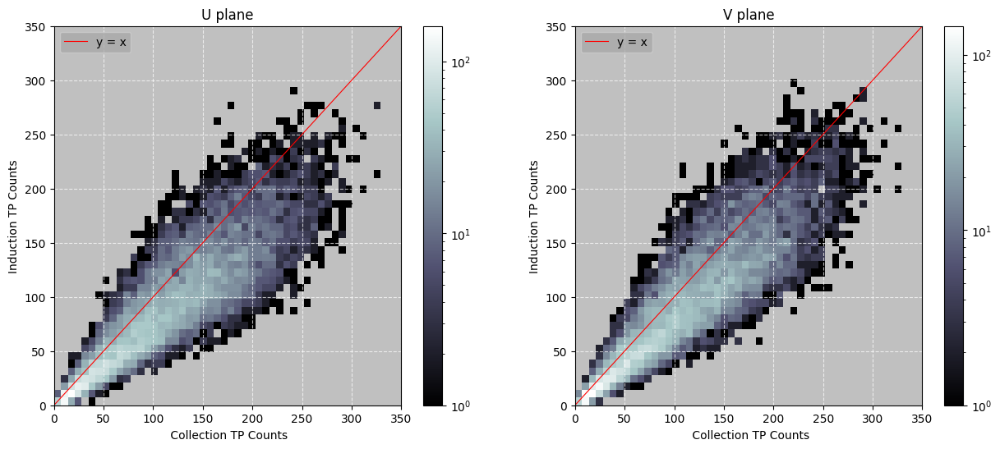

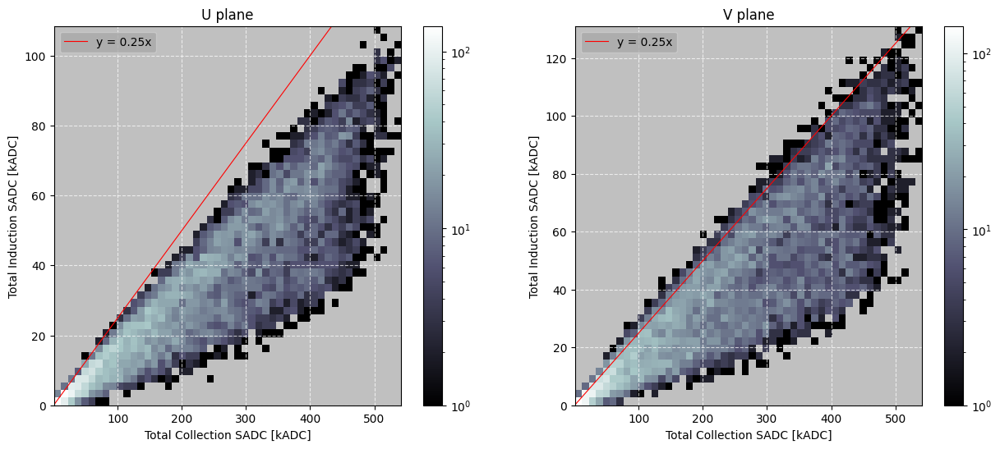

In [27]:

tps2 = tps[(tps.TP_plane==2)]
tps1 = tps[tps.TP_plane==1]
tps0 = tps[tps.TP_plane==0]
mcf = mc[mc.event.isin(tps2.event.unique())]


ind_type = [tps0, tps1]
label = ['U plane', 'V plane']
cmap = 'bone'; b = 50

fig, ax = plt.subplots(1,2, figsize=(15,6))
for i, plane in enumerate(ind_type):
    # Ensure all events in tps2 are represented, fill missing events with zero
    plane_counts = plane.groupby('event').size().reindex(tps2['event'].unique(), fill_value=0)    
    h = ax[i].hist2d(tps2.groupby('event').size(), plane_counts, range=[(0, 350), (0, 350)], bins=(b, b), cmap=cmap, norm=LogNorm())
    ax[i].plot([0, 350], [0, 350], color='r', linewidth=0.8, linestyle='solid', label = 'y = x')
    ax[i].set_xlabel(" Collection TP Counts")
    ax[i].set_ylabel( "Induction TP Counts")
    plt.colorbar(h[3], ax=ax[i])
    ax[i].set_title(f'{label[i]}')
    ax[i].grid(alpha=0.7,color='white', linestyle='--')
    ax[i].set_facecolor(facecolor)
    ax[i].legend(loc='upper left')
plt.show()


fig, ax = plt.subplots(1,2, figsize=(15,6))
for i, plane in enumerate(ind_type):
    # Ensure all events in tps2 are represented, fill missing events with zero
    plane_counts = plane.groupby('event').TP_SADC.sum().reindex(tps2['event'].unique(), fill_value=0)
    h = ax[i].hist2d(tps2.groupby('event').TP_SADC.sum()/1e3, plane_counts/1e3,bins=(b, b), cmap=cmap, norm=LogNorm())
    ax[i].plot([0, 35e6], [0, 35e6/4], color='r', linewidth=0.8, linestyle='solid',label = 'y = 0.25x')
    ax[i].set_xlabel("Total Collection SADC [kADC]")
    ax[i].set_ylabel("Total Induction SADC [kADC]")
    plt.colorbar(h[3], ax=ax[i])
    ax[i].set_title(f'{label[i]}')
    ax[i].grid(alpha=0.7,color='white', linestyle='--')
    ax[i].set_facecolor(facecolor)
    ax[i].legend(loc='upper left')
plt.show()

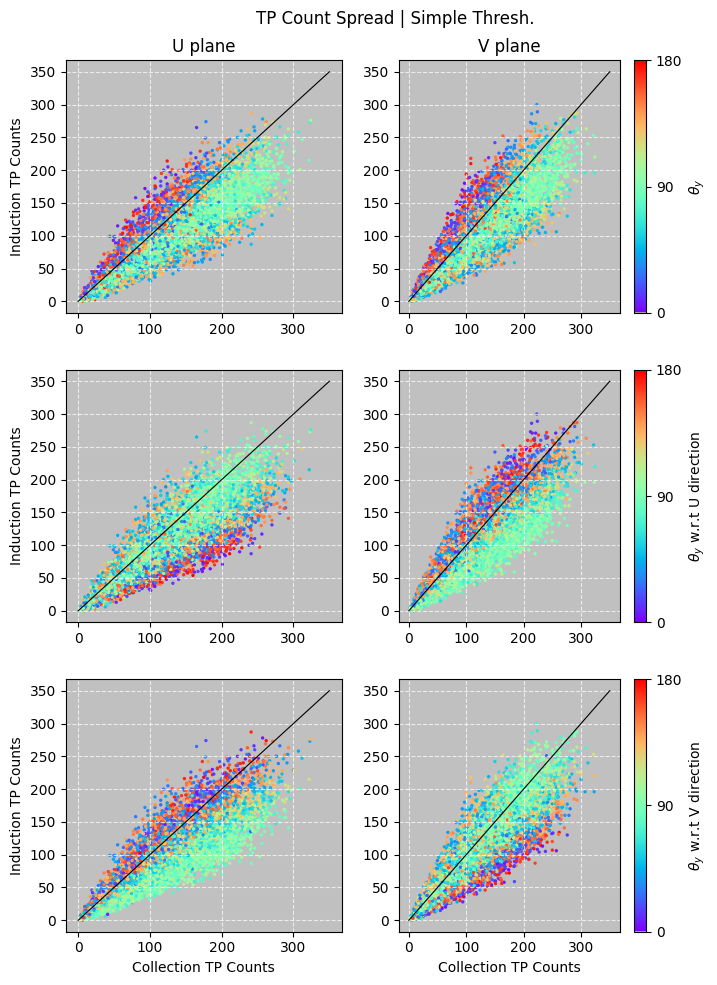

In [28]:
ind_type = [tps0, tps1]
label = ['U plane', 'V plane']
clabel = [r'$\theta_y$', r'$\theta_y$ w.r.t U direction', r'$\theta_y$ w.r.t V direction']
data = [mcf.theta_y, mcf.theta_yU, mcf.theta_yV]

fig, ax = plt.subplots(3, 2, figsize=(8, 10), dpi=100)
for j, d in enumerate(data):
    for i, plane in enumerate(ind_type):
        plane_counts = plane.groupby('event').size().reindex(tps2['event'].unique(), fill_value=0)
        sc = ax[j, i].scatter(tps2.groupby('event').size(), plane_counts, c=d, s=2, cmap='rainbow')
        ax[j, i].plot([0, 350], [0, 350], color='k', linewidth=0.8)
        ax[2, i].set_xlabel("Collection TP Counts")
        ax[j, 0].set_ylabel("Induction TP Counts")
        ax[j, i].set_title(f'{label[i]}' if j == 0 else '')
        ax[j, i].grid(alpha=0.7, color='white', linestyle='--')
        ax[j, i].set_facecolor(facecolor)
    
    cbar = plt.colorbar(sc, ax=ax[j, 1], orientation='vertical',)
    cbar.set_ticks([0, 90, 180])
    cbar.set_label(clabel[j])

plt.suptitle("TP Count Spread | Simple Thresh.")
plt.tight_layout(w_pad=2, h_pad=2)
plt.subplots_adjust(right=0.85)
plt.show()

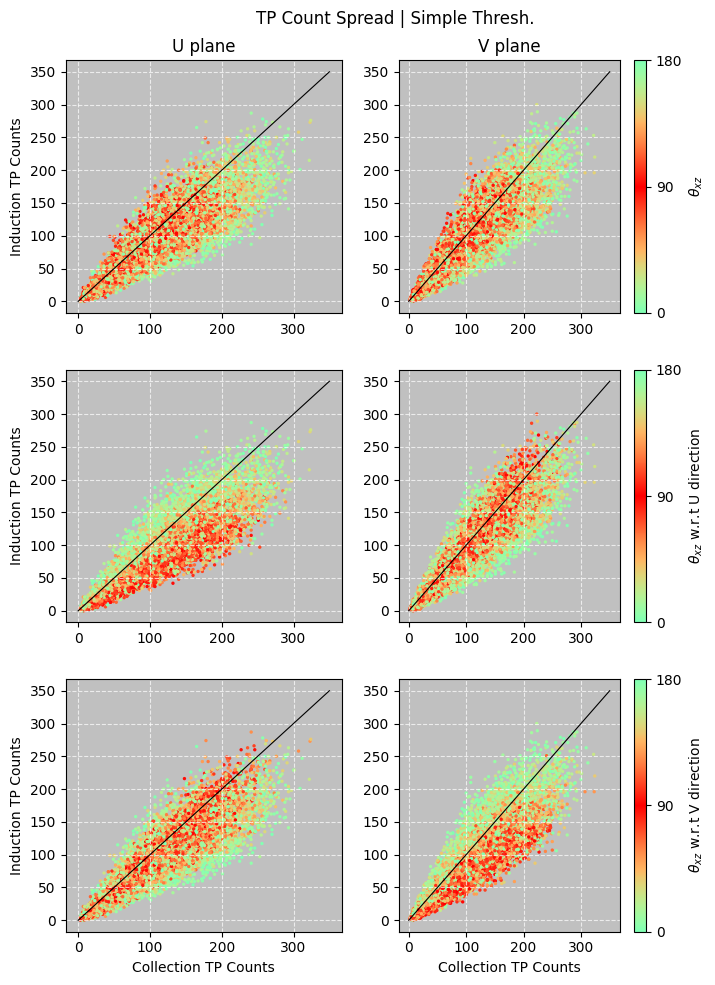

In [29]:

ind_type = [tps0, tps1]
label = ['U plane', 'V plane']
clabel = [r'$\theta_{xz}$', r'$\theta_{xz}$ w.r.t U direction', r'$\theta_{xz}$ w.r.t V direction']
data = [mc.theta_xz, mc.theta_xzU, mc.theta_xzV]

fig, ax = plt.subplots(3, 2, figsize=(8, 10), dpi=100)
for j, d in enumerate(data):
    for i, plane in enumerate(ind_type):
        plane_counts = plane.groupby('event').size().reindex(tps2['event'].unique(), fill_value=0)
        sc = ax[j, i].scatter(tps2.groupby('event').size(), plane_counts, c=d, s=2, cmap=cmap3)
        ax[j, i].plot([0, 350], [0, 350], color='k', linewidth=0.8)
        ax[2, i].set_xlabel("Collection TP Counts")
        ax[j, 0].set_ylabel("Induction TP Counts")
        ax[j, i].set_title(f'{label[i]}' if j == 0 else '')
        ax[j, i].grid(alpha=0.7, color='white', linestyle='--')
        ax[j, i].set_facecolor(facecolor)
    
    cbar = plt.colorbar(sc, ax=ax[j, 1], orientation='vertical',)
    cbar.set_ticks([0, 90, 180])
    cbar.set_label(clabel[j])

plt.suptitle("TP Count Spread | Simple Thresh.")
plt.tight_layout(w_pad=2, h_pad=2)
plt.subplots_adjust(right=0.85)
plt.show()

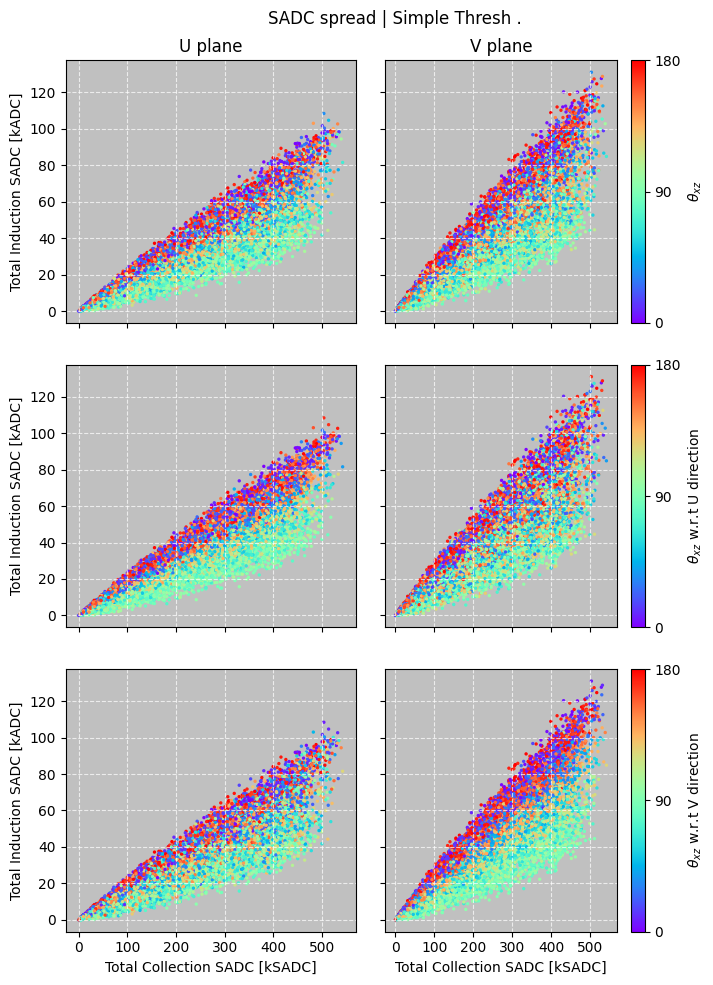

In [30]:
ind_type = [tps0, tps1]
label = ['U plane', 'V plane']
clabel = [r'$\theta_{xz}$', r'$\theta_{xz}$ w.r.t U direction', r'$\theta_{xz}$ w.r.t V direction']
data = [mc.theta_xz, mc.theta_xzU, mc.theta_xzV]

fig, ax = plt.subplots(3, 2, figsize=(8, 10), dpi=100, sharex=True, sharey = True)
for j, d in enumerate(data):
    for i, plane in enumerate(ind_type):
        plane_counts = plane.groupby('event').TP_SADC.sum().reindex(tps2['event'].unique(), fill_value=0)
        sc = ax[j, i].scatter(tps2.groupby('event').TP_SADC.sum()/1000, plane_counts/1000, c=d, s=2, cmap='rainbow')
        ax[2, i].set_xlabel("Total Collection SADC [kSADC]")
        ax[j, 0].set_ylabel("Total Induction SADC [kADC]")
        ax[j, i].set_title(f'{label[i]}' if j == 0 else '')
        ax[j, i].grid(alpha=0.7, color='white', linestyle='--')
        ax[j, i].set_facecolor(facecolor)
    
    cbar = plt.colorbar(sc, ax=ax[j, 1], orientation='vertical',)
    cbar.set_ticks([0, 90, 180])
    cbar.set_label(clabel[j])
plt.suptitle("SADC spread | Simple Thresh .")

plt.tight_layout(w_pad=2, h_pad=2)
plt.subplots_adjust(right=0.85)
plt.show()

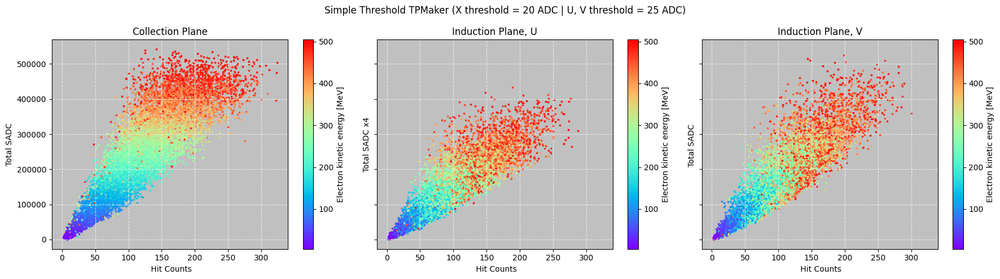

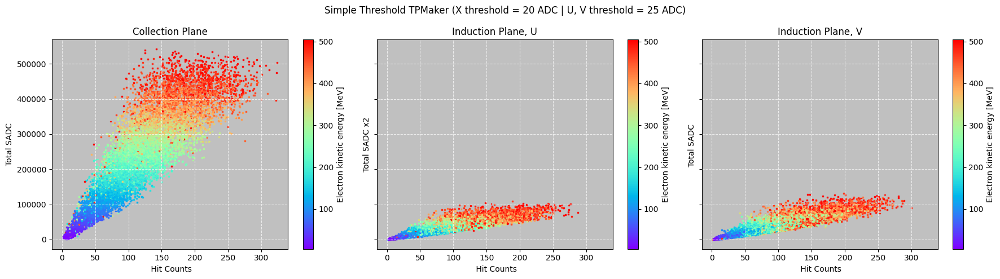

In [33]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True, sharex=True)

cmap = 'rainbow'
# X
axes[0].set_title("Collection Plane")
axes[0].scatter(tps2.groupby('event').size(), tps2.groupby('event').TP_SADC.sum() , s=2, marker='s', c=mc.Ekin, cmap=cmap)
axes[0].set_xlabel(" Hit Counts")
axes[0].set_ylabel("Total SADC")
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label("Electron kinetic energy [MeV]")

#U
axes[1].set_title("Induction Plane, U")
axes[1].scatter(tps0.groupby('event').size(), tps0.groupby('event').TP_SADC.sum() *4, s=2, marker='s', c=mc[mc.event.isin(tps0.event.unique())].Ekin, cmap=cmap)
axes[1].set_xlabel(" Hit Counts")
axes[1].set_ylabel("Total SADC x4")
cbar1 = plt.colorbar(axes[1].collections[0], ax=axes[1])
cbar1.set_label("Electron kinetic energy [MeV]")

#V
axes[2].set_title("Induction Plane, V")
axes[2].scatter(tps1.groupby('event').size(), tps1.groupby('event').TP_SADC.sum() *4, s=2, marker='s', c=mc[mc.event.isin(tps1.event.unique())].Ekin, cmap=cmap)
axes[2].set_xlabel(" Hit Counts")
axes[2].set_ylabel("Total SADC ")
cbar2 = plt.colorbar(axes[2].collections[0], ax=axes[2])
cbar2.set_label("Electron kinetic energy [MeV]")

for i in [0,1,2]:
    axes[i].grid(alpha=0.7,color='white', linestyle='--')
    axes[i].set_facecolor(facecolor)


plt.suptitle("Simple Threshold TPMaker (X threshold = 20 ADC | U, V threshold = 25 ADC)")
plt.tight_layout()

plt.show()


fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True, sharex=True)

cmap = 'rainbow'
# X
axes[0].set_title("Collection Plane")
axes[0].scatter(tps2.groupby('event').size(), tps2.groupby('event').TP_SADC.sum() , s=2, marker='s', c=mc.Ekin, cmap=cmap)
axes[0].set_xlabel(" Hit Counts")
axes[0].set_ylabel("Total SADC")
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label("Electron kinetic energy [MeV]")

#U
axes[1].set_title("Induction Plane, U")
axes[1].scatter(tps0.groupby('event').size(), tps0.groupby('event').TP_SADC.sum() , s=2, marker='s', c=mc[mc.event.isin(tps0.event.unique())].Ekin, cmap=cmap)
axes[1].set_xlabel(" Hit Counts")
axes[1].set_ylabel("Total SADC x2")
cbar1 = plt.colorbar(axes[1].collections[0], ax=axes[1])
cbar1.set_label("Electron kinetic energy [MeV]")

#V
axes[2].set_title("Induction Plane, V")
axes[2].scatter(tps1.groupby('event').size(), tps1.groupby('event').TP_SADC.sum(), s=2, marker='s', c=mc[mc.event.isin(tps1.event.unique())].Ekin, cmap=cmap)
axes[2].set_xlabel(" Hit Counts")
axes[2].set_ylabel("Total SADC ")
cbar2 = plt.colorbar(axes[2].collections[0], ax=axes[2])
cbar2.set_label("Electron kinetic energy [MeV]")

for i in [0,1,2]:
    axes[i].grid(alpha=0.7,color='white', linestyle='--')
    axes[i].set_facecolor(facecolor)


plt.suptitle("Simple Threshold TPMaker (X threshold = 20 ADC | U, V threshold = 25 ADC)")
plt.tight_layout()

plt.show()

# Trying to get drift distance without PDS

## Simple Threshold

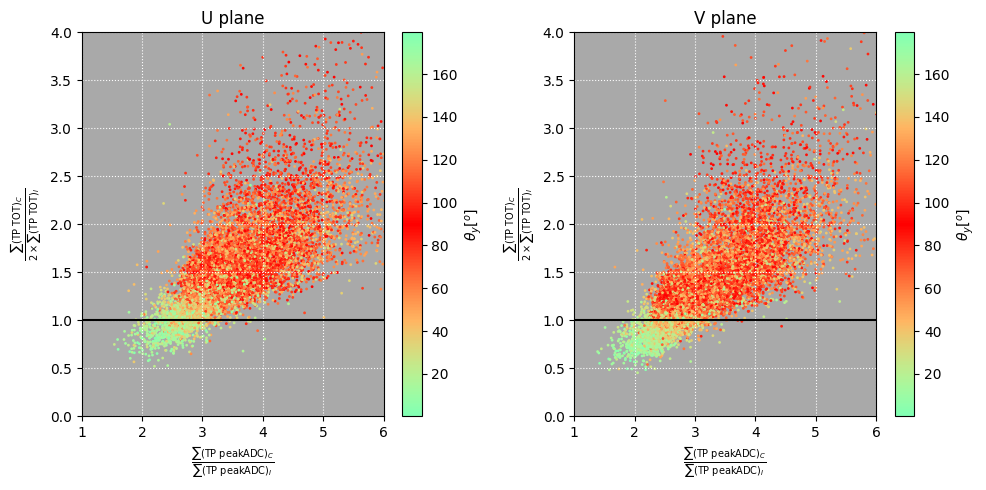

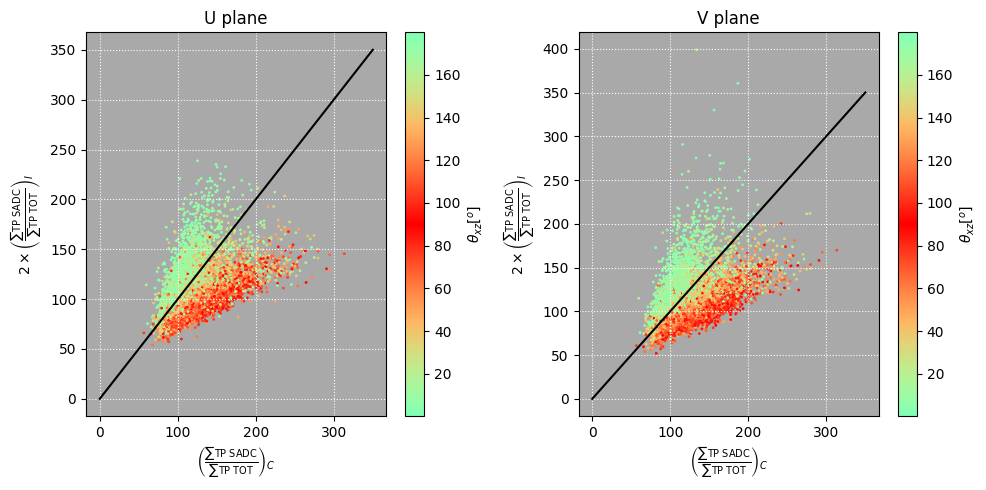

In [34]:
tps2= tps2[(tps2.event.isin(tps0.event.unique()) & (tps2.event.isin(tps1.event.unique())))]
mcf = mc[mc.event.isin(tps2.event.unique())]
tps1 = tps1[tps1.event.isin(tps2.event.unique())]
tps0 = tps0[tps0.event.isin(tps2.event.unique())]

#correction for having half of the pulse 
tps0_tot = tps0.groupby('event').TP_TOT.sum() * 2
tps1_tot = tps1.groupby('event').TP_TOT.sum() * 2


fig, ax = plt.subplots(1,2,figsize=(10,5))
s = ax[0].scatter(tps2.groupby('event').TP_peakADC.sum()/ tps0.groupby('event').TP_peakADC.sum(),  tps2.groupby('event').TP_TOT.sum()/ tps0_tot,  c= mcf.theta_y, cmap = cmap3,s=1)
cbar = plt.colorbar(s, ax = ax[0])
cbar.set_label(r"$\theta_{y} [^{o}]$")

title=['U plane', 'V plane']

s = ax[1].scatter(tps2.groupby('event').TP_peakADC.sum()/ tps1.groupby('event').TP_peakADC.sum(), tps2.groupby('event').TP_TOT.sum()/ tps1_tot, c= mcf.theta_y, cmap = cmap3,s=1)
cbar = plt.colorbar(s, ax = ax[1])
cbar.set_label(r"$\theta_{y} [^{o}]$")

for i in [0,1]:
    ax[i].set_ylim(0,4)
    ax[i].set_xlim(1,6)
    ax[i].plot([0,8],[1,1], 'k-')
    ax[i].set_xlabel(r"$\frac{\sum (\text{TP peakADC})_{C}}{\sum (\text{TP peakADC})_{I}} $")
    ax[i].set_ylabel(r"$\frac{\sum (\text{TP TOT})_{C}}{2 \times \sum (\text{TP TOT})_{I}} $")
    ax[i].set_title(title[i])
plt.tight_layout()
plt.show()



fig, ax = plt.subplots(1,2,figsize=(10,5))


s = ax[0].scatter(tps2.groupby('event').TP_SADC.sum()/ tps2.groupby('event').TP_TOT.sum(), 4*(tps0.groupby('event').TP_SADC.sum()/ tps0_tot), c= mcf.theta_xz, cmap = cmap3,s=1)
cbar = plt.colorbar(s, ax = ax[0])
cbar.set_label(r"$\theta_{xz} [^{o}]$")

s = ax[1].scatter(tps2.groupby('event').TP_SADC.sum()/ tps2.groupby('event').TP_TOT.sum(), 4*(tps1.groupby('event').TP_SADC.sum()/ tps1_tot), c= mcf.theta_xz, cmap = cmap3,s=1)
cbar = plt.colorbar(s, ax = ax[1])
cbar.set_label(r"$\theta_{xz} [^{o}]$")
for i in [0,1]:
    ax[i].plot([0,350],[0,350], 'k-')
    ax[i].set_xlabel(r"$\left( \frac{\sum \text{TP SADC}}{\sum \text{TP TOT}}\right)_{C} $")
    ax[i].set_ylabel(r"$ 2 \times \left( \frac{\sum \text{TP SADC}}{\sum \text{TP TOT}}\right)_{I} $")
    ax[i].set_title(title[i])

plt.tight_layout()
plt.show()



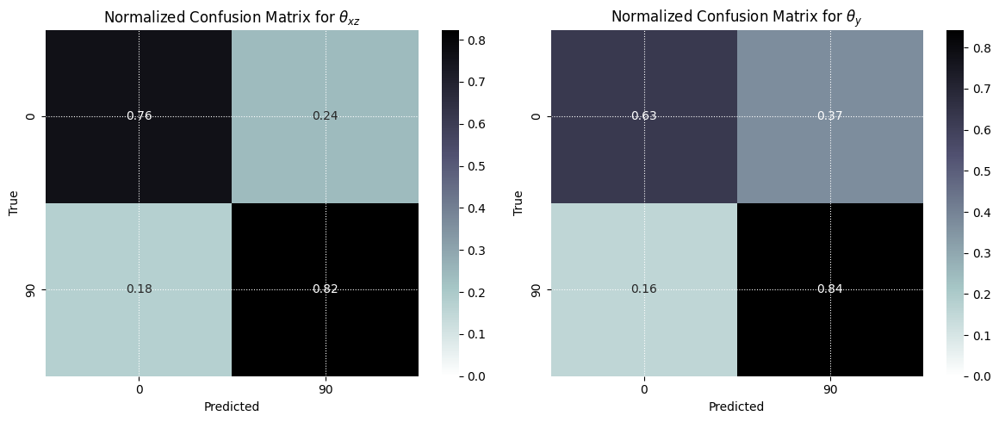

In [35]:
def GetDirection(df, correction_factor, tot_correction):

    #a function to determine the rough orientation of the event wrt. the collection plane (obtaining theta_y and theta_xz)
    #Group TPs by plane ID
    tps2 = df[df.TP_plane==2]
    tps0 = df[df.TP_plane==0]
    tps1 = df[df.TP_plane==1]

    sum_TOT_col = tps2.groupby('event').TP_TOT.sum()
    sum_TOT_ind = tps1.groupby('event').TP_TOT.sum() * tot_correction

    sum_SADC_col = tps2.groupby('event').TP_SADC.sum()
    sum_SADC_ind = tps1.groupby('event').TP_SADC.sum() * correction_factor

    #ratio between collection and induction TOTs to get theta_y 
    TOT_ratio = sum_TOT_col/sum_TOT_ind
    df['theta_y'] = df['event'].apply(lambda event: 0 if TOT_ratio.get(event, 0) < 1.15 else 90)

    #ratio between SADC and TOT in collection plane to get theta_xz
    energy_to_tot_ratio_c = sum_SADC_col/sum_TOT_col
    energy_to_tot_ratio_i = (sum_SADC_ind/sum_TOT_ind) 

    ratios =  energy_to_tot_ratio_c /energy_to_tot_ratio_i 

    df['theta_xz'] = df['event'].apply(lambda event: 0 if ratios.get(event, 0) < 1.15 else 90)

    return df


from sklearn.metrics import confusion_matrix
import seaborn as sns


tps = GetDirection(tps, 4, 2)

def discretize_true_theta(theta):
    if (theta > 90): 
        theta = 180 - theta  # Adjusting the angle for symmetric distribution
    if (theta <= 45):
        return 0
    else:
        return 90

# Applying discretization to true theta values
true_theta_y = mc.theta_y.apply(discretize_true_theta)
true_theta_xz = mc.theta_xz.apply(discretize_true_theta)

pred_theta_y = tps.groupby('event').theta_y.mean()
pred_theta_xz = tps.groupby('event').theta_xz.mean()

#  confusion matrix for theta_y and theta_xz
cm_y = confusion_matrix(true_theta_y, pred_theta_y, labels=[0, 90])
cm_xz = confusion_matrix(true_theta_xz, pred_theta_xz, labels=[0, 90])

# Normalize confusion matrices to fractions
cm_y_norm = cm_y.astype('float') / cm_y.sum(axis=1)[:, np.newaxis]
cm_xz_norm = cm_xz.astype('float') / cm_xz.sum(axis=1)[:, np.newaxis]

# Plotting the confusion matrices
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Confusion matrix for theta_xz
sns.heatmap(cm_xz_norm, annot=True, fmt='.2f', cmap='bone_r', xticklabels=[0, 90], yticklabels=[0, 90], ax=ax[0],vmin =0)
ax[0].set_title(rf"Normalized Confusion Matrix for $\theta_{{xz}}$")
ax[0].set_xlabel('Predicted')
ax[0].set_ylabel('True')

# Confusion matrix for theta_y
sns.heatmap(cm_y_norm, annot=True, fmt='.2f', cmap='bone_r', xticklabels=[0, 90], yticklabels=[0, 90], ax=ax[1],vmin =0)
ax[1].set_title(rf"Normalized Confusion Matrix for $\theta_{{y}}$")
ax[1].set_xlabel('Predicted')
ax[1].set_ylabel('True')

plt.tight_layout()
plt.show()





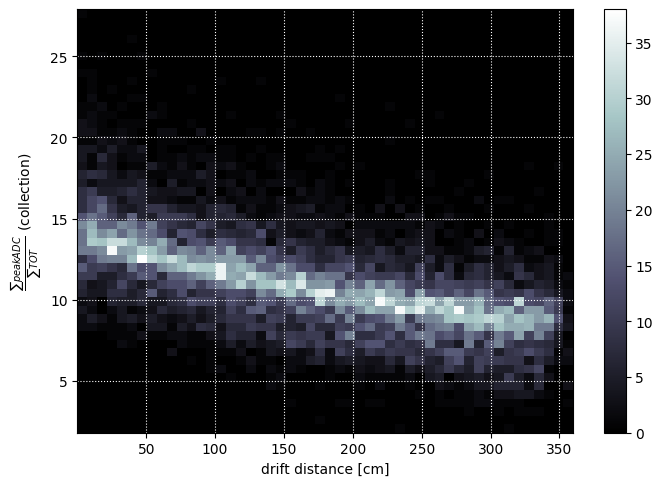

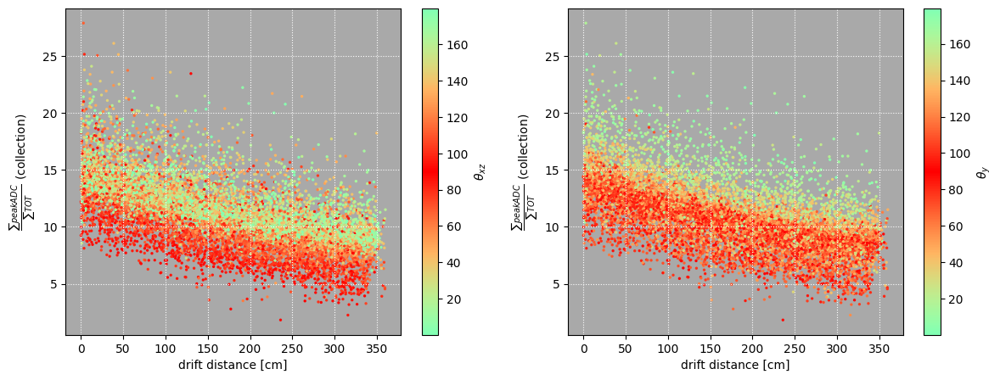

In [222]:
tp2 = tps[tps.TP_plane==2].groupby('event')
peakADC_to_TOT = tp2.TP_peakADC.sum()/ tp2.TP_TOT.sum() 
plt.figure(figsize=(8,5.5))
plt.hist2d(abs(tp2.TP_trueX.mean()),peakADC_to_TOT ,bins =(50,50),cmap='bone', )
plt.xlabel("drift distance [cm]")
plt.ylabel(r"$\frac{\sum peakADC}{\sum TOT}$ (collection)")
plt.colorbar()
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(14, 5))
s=ax[0].scatter( abs(tp2.TP_trueX.mean()),peakADC_to_TOT ,cmap=cmap3,s=2, c = mc.theta_xz)
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"$\theta_{xz}$")

s=ax[1].scatter( abs(tp2.TP_trueX.mean()),peakADC_to_TOT ,cmap=cmap3,s=2, c = mc.theta_y)
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"$\theta_{y}$")

for i in [0,1]:
    ax[i].set_ylabel(r"$\frac{\sum peakADC}{\sum TOT}$ (collection)")
    ax[i].set_xlabel("drift distance [cm]")

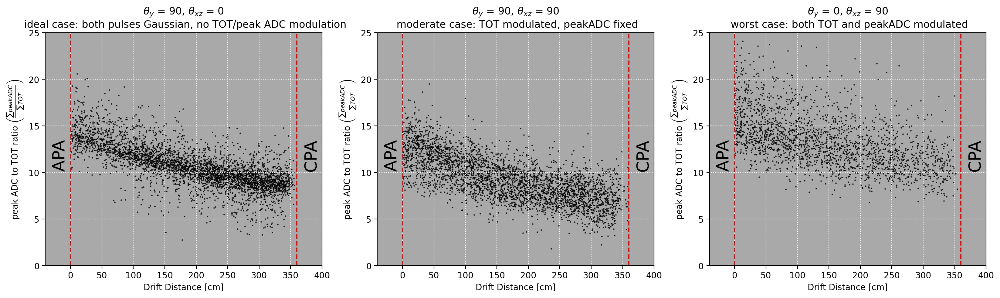

In [37]:
'''
theta_xz = 90 --> large TOT, theta_xz = 0 --> normal TOT (standard Gaussian pulse)
Opposite case for theta_y
theta_y = 90 -->  normal peakADC (standard Gaussian pulse), theta_y = 0 --> large peakADC
'''
fig, ax = plt.subplots(1,3, figsize=(20,5), dpi = 200)
#Best-case scenario in both directions we have normal Gaussian pulses so theta_xz = 0, and theta_y = 90 --> gives narrow dependence on drift
theta_xz =0; theta_y = 90
tp2 = tps[tps.TP_plane==2]
tp2= tp2[(tp2.theta_xz == theta_xz) &(tp2.theta_y ==theta_y)]

tp2 = tp2.groupby('event')
peakADC_to_TOT = tp2.TP_peakADC.sum()/ tp2.TP_TOT.sum() 
ax[0].scatter( abs(tp2.TP_trueX.mean()),peakADC_to_TOT ,s=2, c = 'k', marker='.', alpha =0.8)
ax[0].set_title(rf"$\theta_y$ = {theta_y}, $\theta_{{xz}}$ = {theta_xz}" +"\n ideal case: both pulses Gaussian, no TOT/peak ADC modulation")
for i in [0,1,2]:
    ax[i].set_ylim(0,25)
    ax[i].set_xlabel("Drift Distance [cm]")
    ax[i].set_xlim(-40,400)
    ax[i].text(-30, 10.5, "APA", rotation = 90, fontsize = 20)
    ax[i].text(370, 10.5, "CPA", rotation = 90, fontsize = 20)
    ax[i].vlines(0, 0, 25, color='r', linestyle='dashed')
    ax[i].vlines(360, 0, 25, color='r', linestyle='dashed')
    ax[i].set_ylabel(r"peak ADC to TOT ratio $\left(\frac{\sum peakADC}{\sum TOT}\right)$")

# moderate case - theta_xz behaves well but theta_y does not --> actually impossible to have this setup 
'''
fig, ax = plt.subplots(1, 2, figsize=(14, 5), sharey=True)
theta_xz =0; theta_y = 0
tp2 = tps[tps.TP_plane==2]
tp2= tp2[(tp2.theta_xz == theta_xz) &(tp2.theta_y ==theta_y)]
evs = tp2.event.unique()

tp2 = tp2.groupby('event')
peakADC_to_TOT = (tp2.TP_peakADC.sum()/(tp2.TP_SADC.sum()) ) * 10
s=ax[0].scatter( abs(tp2.TP_trueX.mean()),peakADC_to_TOT ,cmap=cmap3,s=2, c = mc[mc.event.isin(evs)].theta_xz)
cbar = plt.colorbar(s, ax=ax[0])
cbar.set_label(r"$\theta_{xz}$")

s=ax[1].scatter( abs(tp2.TP_trueX.mean()),peakADC_to_TOT ,cmap=cmap3,s=2, c = mc[mc.event.isin(evs)].theta_y)
cbar = plt.colorbar(s, ax=ax[1])
cbar.set_label(r"$\theta_{y}$")
plt.suptitle(rf"$\theta_y$ = {theta_y}, $\theta_{{xz}}$ = {theta_xz}" +"\n moderate case, peakADC modulated, TOT fixed")
plt.show()
'''
#the other moderate case - theta_y behaves well but theta_xz does not --> TOT is elongated by ~8 ticks
theta_xz =90; theta_y = 90
tp2 = tps[tps.TP_plane==2]
tp2= tp2[(tp2.theta_xz == theta_xz) &(tp2.theta_y ==theta_y)]
tp2 = tp2.groupby('event')
peakADC_to_TOT = (tp2.TP_peakADC.sum()/(tp2.TP_TOT.sum()) ) 
ax[1].scatter( abs(tp2.TP_trueX.mean()),peakADC_to_TOT ,c='k',marker='.',s=2 , alpha =0.8)
ax[1].set_title(rf"$\theta_y$ = {theta_y}, $\theta_{{xz}}$ = {theta_xz}" +"\n moderate case: TOT modulated, peakADC fixed")


#Worst  case - both theta_xz and theta_y are "deformed" by the topological effects on pulse shape 
theta_xz =90; theta_y = 0
tp2 = tps[tps.TP_plane==2]
tp2= tp2[(tp2.theta_xz == theta_xz) &(tp2.theta_y ==theta_y)]
tp2 = tp2.groupby('event')
peakADC_to_TOT = (tp2.TP_peakADC.sum()/(tp2.TP_TOT.sum()) ) 

ax[2].scatter( abs(tp2.TP_trueX.mean()),peakADC_to_TOT ,alpha=0.8, marker='.' ,s=2, c ='k')
ax[2].set_title(rf"$\theta_y$ = {theta_y}, $\theta_{{xz}}$ = {theta_xz}" +"\n worst case: both TOT and peakADC modulated")


plt.show()

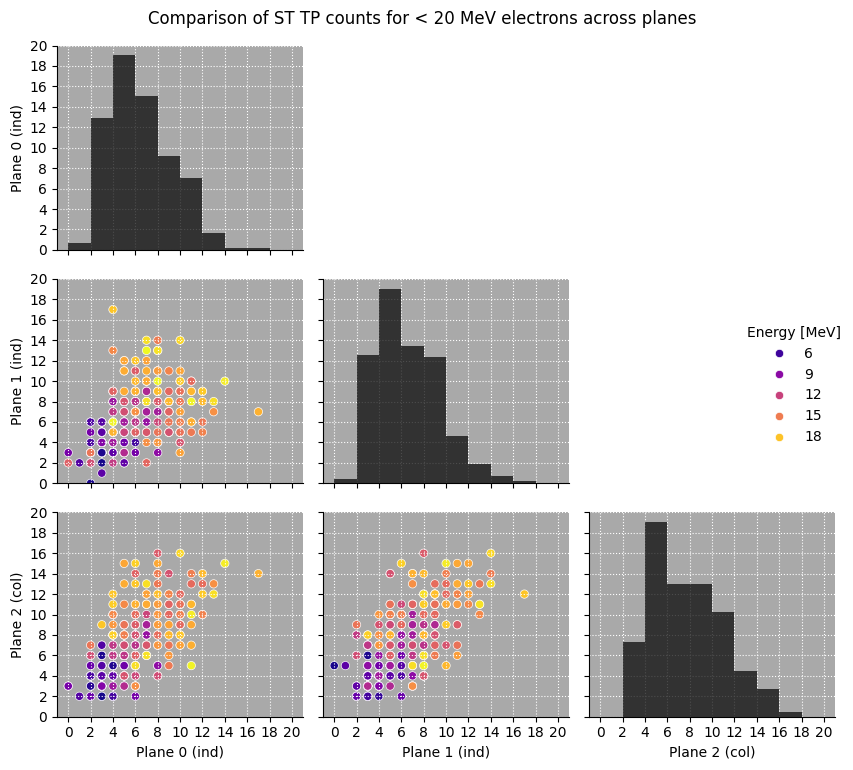

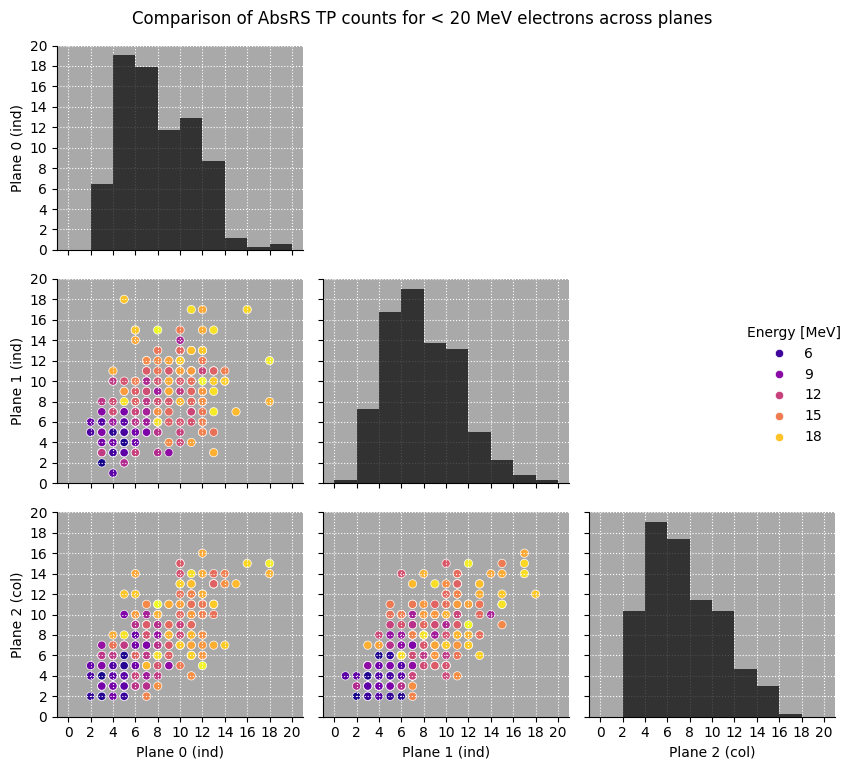

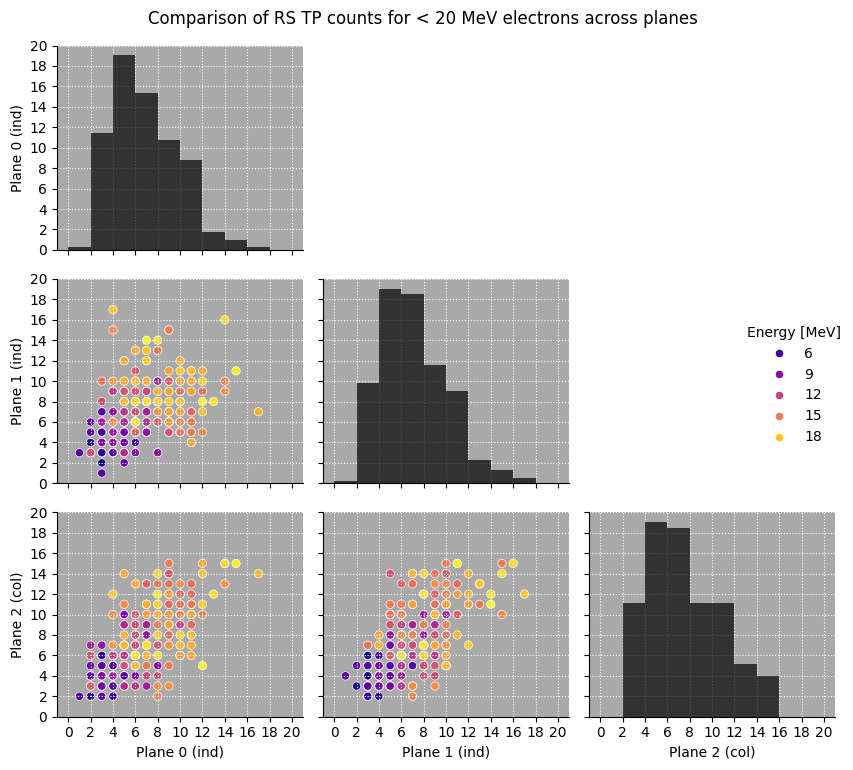

In [140]:
import seaborn as sns
from matplotlib.patches import Rectangle


def PlotPairwiseTPCounts(tp_df, mc_df, alg):
    mc = mc_df
    lowX = tp_df
    x_data, y_data, z_data = [], [], []

    for event_id, group in lowX.groupby('event'):
        x_data.append(group[group.TP_plane == 0].shape[0])
        y_data.append(group[group.TP_plane == 1].shape[0])
        z_data.append(group[group.TP_plane == 2].shape[0])

    x_data, y_data, z_data = np.array(x_data), np.array(y_data), np.array(z_data)

    energy_values = mc[mc.event.isin(lowX.event.unique())].Ekin

    df = pd.DataFrame({
        'Plane 0 (ind)': x_data,
        'Plane 1 (ind)': y_data,
        'Plane 2 (col)': z_data,
        'Energy [MeV]': energy_values
    })

    g = sns.pairplot(df, hue='Energy [MeV]', palette='plasma', plot_kws={'alpha': 1})

    for i, ax in enumerate(g.diag_axes):
        ax.hist(df.iloc[:, i], bins=np.linspace(0, 20, 11), color='black', alpha=0.7)
        ax.set_xticks(np.arange(0, 21, 2))
        ax.set_yticks(np.arange(0, 21, 2))

    for i in range(len(g.axes)):
        for j in range(i + 1, len(g.axes)):
            rect = Rectangle((0, 0), 1, 1, transform=g.axes[i, j].transAxes, color='white')
            g.axes[i, j].add_patch(rect)
            g.axes[i, j].axis('off')

    for ax in g.axes.flatten():
        ax.set_ylim(0, 20)
        ax.set_yticks(np.arange(0, 21, 2))

    plt.tight_layout()
    plt.suptitle(f"Comparison of {alg} TP counts for < 20 MeV electrons across planes", y=1.02)
    plt.show()

#Get event IDs for low energy electrons 
lowE_events = mc[mc.Ekin < 20].event.unique()

lowX = tps[(tps.TP_signal==1) & (tps.event.isin(lowE_events))]
PlotPairwiseTPCounts(lowX, mc, 'ST')

lowX = ars[(ars.TP_signal==1) & (ars.event.isin(lowE_events))]
PlotPairwiseTPCounts(lowX, mc, 'AbsRS')


lowX = rs[(rs.TP_signal==1) & (rs.event.isin(lowE_events))]
PlotPairwiseTPCounts(lowX, mc, 'RS')


In [519]:
mc[(mc.theta_yU <100) & (mc.theta_yU > 80) & (mc.theta_xzU <100) & (mc.theta_xzU > 80)].event.unique()

array([  920,  1007,  1325,  1546,  2461,  2712,  3688,  4060,  5106,
        5169,  5185,  5453,  5606,  5698,  6117,  6340,  6533,  6547,
        7504,  7508,  9983, 10030, 10214, 10246, 10275, 10345, 10367,
       10442, 11699, 11743, 11815, 11835, 11848, 11890, 13841, 13843,
       14271, 14272, 14348, 16182, 16193, 16362, 16608, 16686, 17705,
       17925, 18639, 18678, 19990, 20028, 20039, 20556, 20580, 20600,
       20651, 21274, 21342, 21395, 21431, 21581, 22573, 22658, 22667,
       22864, 23039, 23845, 23908, 24854, 25257, 25401, 26311, 26396,
       26425, 26456, 26909, 26922, 27437, 27442, 27533, 27659, 27866,
       28597, 28622, 28753, 28778, 28983, 29038, 29192, 29241, 29287,
       29293, 29318, 30359, 30624, 30686, 30838, 30942, 30959, 30962,
       32192, 32203, 32231, 32354, 32357, 32418, 32497, 32510, 33042,
       33075, 33084, 33271, 33309, 33503, 34644, 34646, 34814, 35052,
       35721, 35889, 36750, 36819, 36825, 36908, 37040, 37046, 37304,
       37445, 38138,

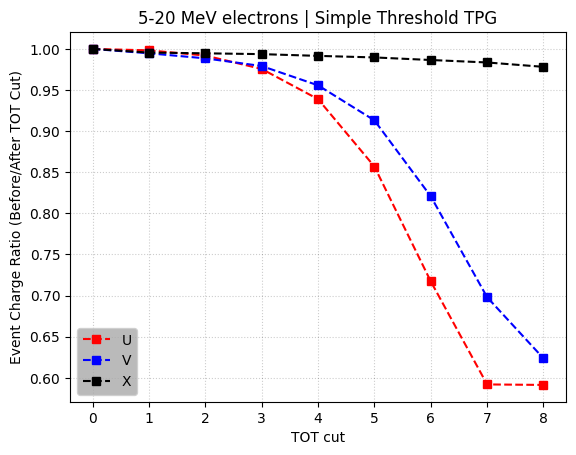

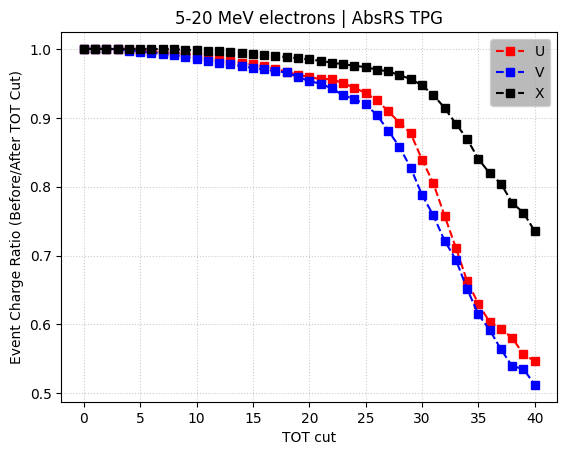

In [189]:
label =['U', 'V', 'X']
col = ['r', 'b', 'k']
ax=plt.subplot()

for plane in [0,1,2]:
    lowX = tps[(tps.event.isin(lowE_events)) & (tps.TP_plane==plane)]
    lowX_SADC = lowX.groupby('event').TP_SADC.sum()
    lowX_SADC_filt = []

    tot_cuts = np.linspace(0,8,9)
    for tot in tot_cuts:
        ratio = np.mean(lowX[lowX.TP_TOT> tot].groupby('event').TP_SADC.sum())/np.mean(lowX_SADC) 
        lowX_SADC_filt.append(ratio)

    plt.plot(tot_cuts, lowX_SADC_filt, 's--', label =label[plane],  c=col[plane])
    plt.xlabel("TOT cut")
    plt.ylabel("Event Charge Ratio (Before/After TOT Cut)")
    plt.title("5-20 MeV electrons | Simple Threshold TPG")
    ax.set_facecolor('white')
    plt.grid(color='k', alpha =0.2)


    plt.legend()
plt.show()
ax=plt.subplot()
for plane in [0,1,2]:
    lowX = ars[(ars.event.isin(lowE_events)) & (ars.TP_plane==plane) & (ars.TP_peakADC > 40)]
    lowX_SADC = lowX.groupby('event').TP_SADC.sum()
    lowX_SADC_filt = []
    tot_cuts = np.linspace(0,40,41)
    for tot in tot_cuts:
        ratio = np.mean(lowX[lowX.TP_TOT> tot].groupby('event').TP_SADC.sum())/np.mean(lowX_SADC) 
        lowX_SADC_filt.append(ratio)

    plt.plot(tot_cuts, lowX_SADC_filt, 's--', label =label[plane], c=col[plane])
    plt.xlabel("TOT cut")
    plt.ylabel("Event Charge Ratio (Before/After TOT Cut)")
    plt.title("5-20 MeV electrons | AbsRS TPG")
    plt.grid(color='k', alpha =0.2)
    ax.set_facecolor('white')
    plt.legend()

## Looking at how good the backtracker is 

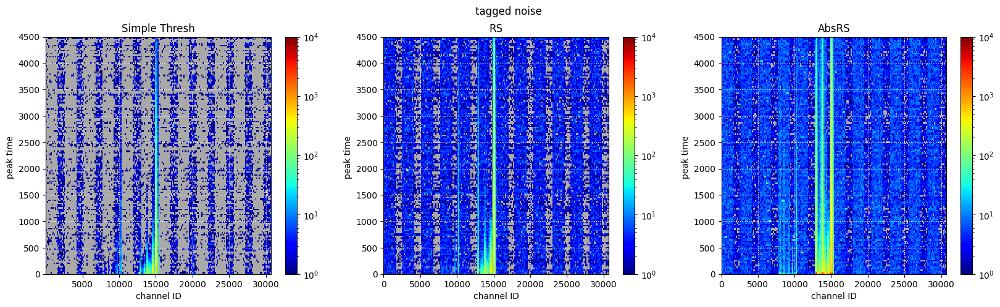

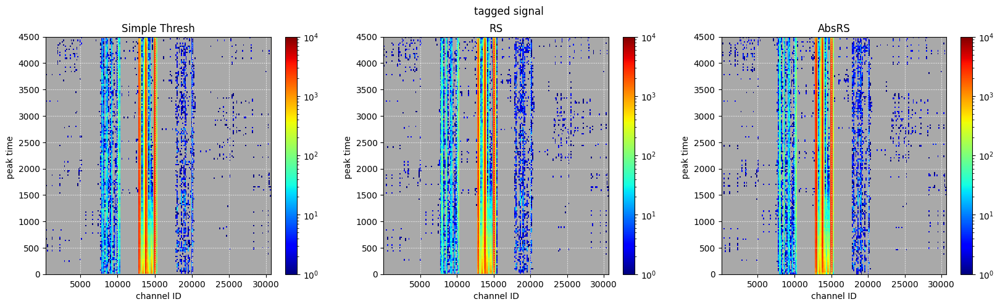

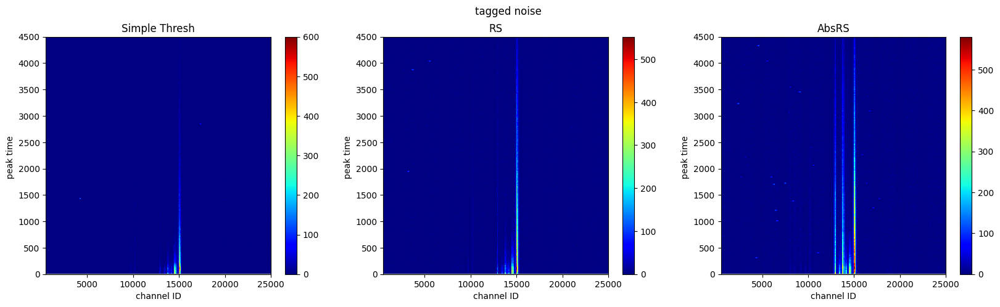

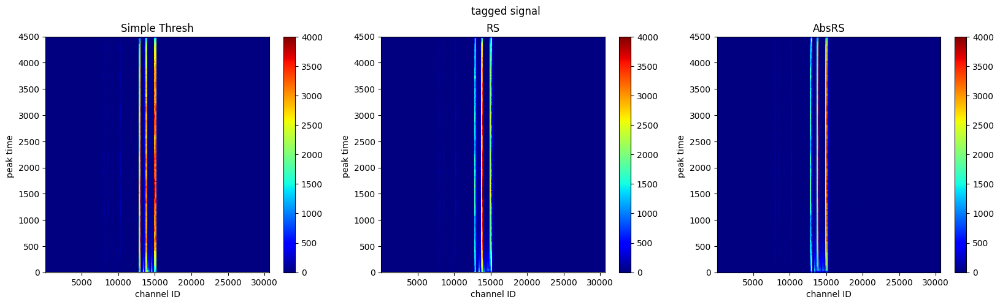

In [21]:
fig, ax =plt.subplots(1,3,figsize=(20,5))
label = ['Simple Thresh', "RS", "AbsRS"]
data = [tps, rs, ars]
for i, d in enumerate(data):

    x = d[(d.TP_signal==0) ]
    h = ax[i].hist2d(x.TP_channel, x.TP_peakT,bins = (200,200), norm = LogNorm(vmax=1e4), cmap ='jet')
    plt.colorbar(h[3], ax=[ax[i]])
    ax[i].set_title(label[i])
    plt.suptitle("tagged noise")
    ax[i].set_xlabel("channel ID")
    ax[i].set_ylabel("peak time ")
    ax[i].set_ylim(0,4500)



fig, ax =plt.subplots(1,3,figsize=(20,5))
label = ['Simple Thresh', "RS", "AbsRS"]
data = [tps, rs, ars]
for i, d in enumerate(data):
    x = d[(d.TP_signal==1) & (d.TP_peakADC>40)]
    h = ax[i].hist2d(x.TP_channel, x.TP_peakT,bins = (200,200),  norm = LogNorm(vmax=1e4), cmap ='jet')
    plt.colorbar(h[3], ax=[ax[i]])
    ax[i].set_title(label[i])
    ax[i].set_xlabel("channel ID")
    ax[i].set_ylabel("peak time ")
    plt.suptitle("tagged signal")
    ax[i].set_ylim(0,4500)




fig, ax =plt.subplots(1,3,figsize=(20,5))
label = ['Simple Thresh', "RS", "AbsRS"]
data = [tps, rs, ars]
for i, d in enumerate(data):
    x = d[(d.TP_signal==0)]
    h = ax[i].hist2d(x.TP_channel, x.TP_peakT,bins = (200,200), range = [(500,25e3), (10,4500)], cmap ='jet')
    plt.colorbar(h[3], ax=[ax[i]])
    ax[i].set_title(label[i])
    plt.suptitle("tagged noise")
    ax[i].set_xlabel("channel ID")
    ax[i].set_ylabel("peak time ")
    ax[i].grid(alpha=0)
    ax[i].set_ylim(0,4500)



fig, ax =plt.subplots(1,3,figsize=(20,5))
label = ['Simple Thresh', "RS", "AbsRS"]
data = [tps, rs, ars]
for i, d in enumerate(data):
    x = d[d.TP_signal==1]
    h = ax[i].hist2d(x.TP_channel, x.TP_peakT,bins = (200,200), vmax=4000, cmap ='jet')
    plt.colorbar(h[3], ax=[ax[i]])
    ax[i].set_title(label[i])
    ax[i].set_xlabel("channel ID")
    ax[i].set_ylabel("peak time ")
    ax[i].set_ylim(0,4500)
    plt.suptitle("tagged signal")
    ax[i].grid(alpha=0)


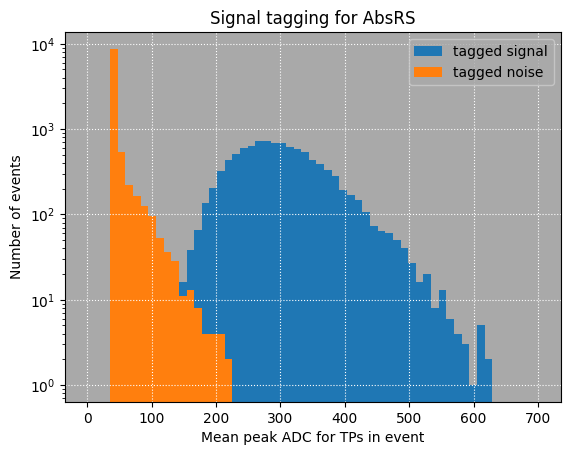

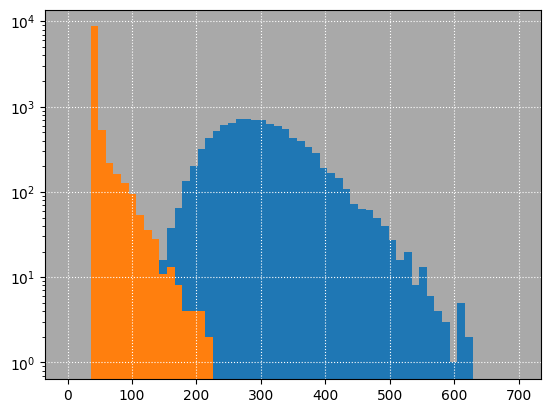

In [22]:
bins = np.linspace(0,700,60)
plt.hist(ars[ars.TP_signal==1].groupby('event').TP_peakADC.mean(),bins = bins, label = 'tagged signal')
plt.hist(ars[(ars.TP_signal==0) & (ars.TP_peakADC> 35)].groupby('event').TP_peakADC.mean(),bins = bins, label ='tagged noise')  
plt.xlabel("Mean peak ADC for TPs in event")
plt.ylabel("Number of events")
plt.legend()
plt.yscale('log')
plt.title("Signal tagging for AbsRS")
plt.show()

bins = np.linspace(0,700,60)
plt.hist(ars[ars.TP_signal==1].groupby('event').TP_peakADC.mean(),bins = bins, label = 'tagged signal')
plt.hist(ars[(ars.TP_signal==0) & (ars.TP_peakADC> 35)].groupby('event').TP_peakADC.mean(),bins = bins, label ='tagged noise')  
plt.yscale('log')
plt.show()